In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
pip install torch-tflite


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement torch-tflite (from versions: none)

[notice] A new release of pip is available: 24.2 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for torch-tflite


In [1]:
!pip install onnx onnx2keras


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 5.5 MB/s eta 0:00:00a 0:00:01
  Created wheel for onnx2keras: filename=onnx2keras-0.0.24-py3-none-any.whl size=24576 sha256=4ae43f527f4dbb18b8e14fb45adecaecfdcad2b8e37d37eb898cdabe442280a8
  Stored in directory: /root/.cache/pip/wheels/a5/a0/fb/eb5b60162f43fa1c199234d7dcfc976fa929715ff513615be8
Successfully built onnx2keras
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.8.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you h

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import ast
import albumentations as A

# ================================
# 1. Paths
# ================================
BASE_DIR = "/kaggle/input/busbra/BUSBRA"
IMG_DIR = f"{BASE_DIR}/Images"
MASK_DIR = f"{BASE_DIR}/Masks"
CSV_PATH = f"{BASE_DIR}/bus_data.csv"

OUT_DIR = "/kaggle/working/busbra_preprocessed"
os.makedirs(OUT_DIR, exist_ok=True)
for sub in ["fic", "bbc", "mic"]:
    os.makedirs(f"{OUT_DIR}/{sub}", exist_ok=True)

# ================================
# 2. Helpers
# ================================
def create_bbc(img, bbox, margin=30):
    x, y, w, h = bbox
    x_min = max(0, x - margin)
    y_min = max(0, y - margin)
    x_max = min(img.shape[1], x + w + margin)
    y_max = min(img.shape[0], y + h + margin)
    return img[y_min:y_max, x_min:x_max]

def create_mic(img, mask):
    masked = img.copy()
    masked[mask > 0] = 0
    return masked

augment = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5)
])

# ================================
# 3. Process dataset
# ================================
df = pd.read_csv(CSV_PATH)

records = []
for _, row in tqdm(df.iterrows(), total=len(df)):
    img_name = row.iloc[0] + ".png" 
    mask_name = "mask_" + img_name.split("_")[1]  # mask_0001-r.png etc.

    img_path = f"{IMG_DIR}/{img_name}"
    mask_path = f"{MASK_DIR}/{mask_name}"

    if not os.path.exists(img_path) or not os.path.exists(mask_path):
        continue

    img = cv2.imread(img_path)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    birads = int(row["BIRADS"])
    bbox = ast.literal_eval(row["BBOX"])  # [x,y,w,h]

    fic = cv2.resize(img, (224, 224))
    bbc = cv2.resize(create_bbc(img, bbox), (224, 224))
    mic = cv2.resize(create_mic(img, mask), (224, 224))

    fic_out = f"{OUT_DIR}/fic/{row.iloc[0]}.png"
    bbc_out = f"{OUT_DIR}/bbc/{row.iloc[0]}.png"
    mic_out = f"{OUT_DIR}/mic/{row.iloc[0]}.png"

    cv2.imwrite(fic_out, fic)
    cv2.imwrite(bbc_out, bbc)
    cv2.imwrite(mic_out, mic)

    records.append([fic_out, bbc_out, mic_out, birads])

df_out = pd.DataFrame(records, columns=["fic_path", "bbc_path", "mic_path", "birads"])
df_out.to_csv(f"{OUT_DIR}/busbra_preprocessed.csv", index=False)
print("✅ Preprocessing done, CSV saved.")

# ================================
# 4. Balance classes with augmentation
# ================================
class_counts = df_out["birads"].value_counts().to_dict()
max_count = max(class_counts.values())

aug_records = []
for birads in class_counts.keys():
    df_class = df_out[df_out["birads"] == birads]
    needed = max_count - len(df_class)

    if needed > 0:
        for i in range(needed):
            row = df_class.sample(1).iloc[0]
            fic = cv2.imread(row["fic_path"])
            bbc = cv2.imread(row["bbc_path"])
            mic = cv2.imread(row["mic_path"])

            fic_aug = augment(image=fic)["image"]
            bbc_aug = augment(image=bbc)["image"]
            mic_aug = augment(image=mic)["image"]

            aug_id = f"{birads}_aug{i}"
            fic_path = f"{OUT_DIR}/fic/{aug_id}.png"
            bbc_path = f"{OUT_DIR}/bbc/{aug_id}.png"
            mic_path = f"{OUT_DIR}/mic/{aug_id}.png"

            cv2.imwrite(fic_path, fic_aug)
            cv2.imwrite(bbc_path, bbc_aug)
            cv2.imwrite(mic_path, mic_aug)

            aug_records.append([fic_path, bbc_path, mic_path, birads])

if aug_records:
    df_aug = pd.DataFrame(aug_records, columns=["fic_path", "bbc_path", "mic_path", "birads"])
    df_out = pd.concat([df_out, df_aug], ignore_index=True)
    df_out.to_csv(f"{OUT_DIR}/busbra_balanced.csv", index=False)

print("✅ Dataset balanced & saved.")

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
100%|██████████| 1875/1875 [00:36<00:00, 50.69it/s]


✅ Preprocessing done, CSV saved.
✅ Dataset balanced & saved.


In [2]:
import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import albumentations as A
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import torchvision.models as models
import random

# ================================
# 1. Paths
# ================================
BASE_DIR = "/kaggle/input/busbra/BUSBRA"
CSV_PATH = "/kaggle/working/busbra_preprocessed/busbra_balanced.csv"
OUT_DIR = "/kaggle/working/busbra_models"
os.makedirs(OUT_DIR, exist_ok=True)

# ================================
# 2. Augmentation (for balancing)
# ================================
augment = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.Affine(translate_percent=0.05, scale=(0.9,1.1), rotate=(-15,15), p=0.5)
])

# ================================
# 3. Load CSV & Balance classes
# ================================
df = pd.read_csv(CSV_PATH)
class_counts = df['birads'].value_counts()
max_count = class_counts.max()

records = []
for birads in class_counts.index:
    df_class = df[df['birads'] == birads]
    records.extend(df_class.to_dict('records'))  # original samples

    # Oversample with augmentation
    needed = max_count - len(df_class)
    if needed > 0:
        for _ in range(needed):
            sample = random.choice(df_class.to_dict('records'))
            new_record = sample.copy()
            # Mark these as augmented for filenames
            new_record['fic_path'] = new_record['fic_path'].replace('.png', f'_aug.png')
            new_record['bbc_path'] = new_record['bbc_path'].replace('.png', f'_aug.png')
            new_record['mic_path'] = new_record['mic_path'].replace('.png', f'_aug.png')
            records.append(new_record)

df_balanced = pd.DataFrame(records)
df_balanced.to_csv("/kaggle/working/busbra_balanced_augmented.csv", index=False)
print(f"✅ Dataset balanced: {df_balanced.shape[0]} samples")

✅ Dataset balanced: 2772 samples


In [6]:
import os
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torchvision.models as models
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

# ======================================
# 1. Paths
# ======================================
MODEL_PATH = "/kaggle/input/modelss/best_model_fold5.pth"   # change fold if needed
CSV_PATH   = "/kaggle/working/busbra_balanced_augmented.csv"
OUT_DIR    = "/kaggle/working/busbra_gradcam"
os.makedirs(OUT_DIR, exist_ok=True)

# ======================================
# 2. Label Mapping (BI-RADS 2–5)
# ======================================
birads_classes = {
    0: "BI-RADS 2 (Benign)",
    1: "BI-RADS 3 (Probably Benign)",
    2: "BI-RADS 4 (Suspicious)",
    3: "BI-RADS 5 (Highly Suggestive of Malignancy)"
}

# ======================================
# 3. Dataset for Evaluation
# ======================================
class BUSBRADataset(Dataset):
    def __init__(self, df):
        self.df = df.reset_index(drop=True)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        fic = cv2.imread(row["fic_path"])
        bbc = cv2.imread(row["bbc_path"])
        mic = cv2.imread(row["mic_path"])

        fic = cv2.cvtColor(fic, cv2.COLOR_BGR2RGB)
        bbc = cv2.cvtColor(bbc, cv2.COLOR_BGR2RGB)
        mic = cv2.cvtColor(mic, cv2.COLOR_BGR2RGB)

        fic = cv2.resize(fic, (224, 224))
        bbc = cv2.resize(bbc, (224, 224))
        mic = cv2.resize(mic, (224, 224))

        fic = torch.from_numpy(fic).permute(2,0,1).float() / 255.0
        bbc = torch.from_numpy(bbc).permute(2,0,1).float() / 255.0
        mic = torch.from_numpy(mic).permute(2,0,1).float() / 255.0

        label = torch.tensor(row["birads"] - 2, dtype=torch.long)
        return fic, bbc, mic, label, row["fic_path"]

# ======================================
# 4. Model (must match training)
# ======================================
class MultiInputResNet50(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.backbone = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.backbone.fc = nn.Identity()
        self.fc = nn.Sequential(
            nn.Linear(2048*3, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, fic, bbc, mic):
        f1 = self.backbone(fic)
        f2 = self.backbone(bbc)
        f3 = self.backbone(mic)
        x = torch.cat([f1,f2,f3], dim=1)
        x = self.fc(x)
        return x

# ======================================
# 5. Grad-CAM
# ======================================
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_layers()

    def hook_layers(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, input_tensor, class_idx):
        self.model.zero_grad()
        out = self.model(input_tensor)   # ✅ directly call the backbone
        one_hot = torch.zeros_like(out)
        one_hot[0, class_idx] = 1
        out.backward(gradient=one_hot)

        weights = self.gradients.mean(dim=[2,3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = torch.nn.functional.interpolate(cam, size=(224,224), mode="bilinear", align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam


# ======================================
# 6. Load Model
# ======================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
df = pd.read_csv(CSV_PATH)
num_classes = df["birads"].nunique()

model = MultiInputResNet50(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()

# Grad-CAM on the FIC stream (can also do BBC/MIC separately)
gradcam = GradCAM(model.backbone, model.backbone.layer4)

# ======================================
# 7. Run Predictions + Heatmaps
# ======================================
dataset = BUSBRADataset(df.sample(10, random_state=42))  # take 10 examples
loader = DataLoader(dataset, batch_size=1, shuffle=False)

softmax = nn.Softmax(dim=1)

for fic, bbc, mic, label, path in loader:
    fic, bbc, mic, label = fic.to(device), bbc.to(device), mic.to(device), label.to(device)

    outputs = model(fic, bbc, mic)
    probs = softmax(outputs)
    pred_class = probs.argmax(1).item()
    confidence = probs.max().item()

    # Grad-CAM heatmap (FIC only for simplicity)
    cam = gradcam.generate(fic, pred_class)

    # Overlay
    img = fic[0].permute(1,2,0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Save
    filename = os.path.basename(path[0]).replace(".png","_gradcam.png")
    cv2.imwrite(os.path.join(OUT_DIR, filename), cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

    print(f"{path[0]} | True BI-RADS: {label.item()+2} | Pred: {birads_classes[pred_class]} ({confidence:.2f})")

print(f"\n✅ Saved Grad-CAM overlays in {OUT_DIR}")


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


/kaggle/working/busbra_preprocessed/fic/bus_0637-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug66.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0468-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0348-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0330-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0284-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0512-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug84.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0128-s.png | True BI-RADS: 3 | Pred: BI-RADS 

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torchvision.models as models
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm

# ======================================
# 1. Paths
# ======================================
MODEL_PATH = "/kaggle/input/modelss/best_model_fold5.pth"   # change fold if needed
CSV_PATH   = "/kaggle/working/busbra_balanced_augmented.csv"
OUT_DIR    = "/kaggle/working/busbra_gradcam"
os.makedirs(OUT_DIR, exist_ok=True)

# ======================================
# 2. Label Mapping (BI-RADS 2–5)
# ======================================
birads_classes = {
    0: "BI-RADS 2 (Benign)",
    1: "BI-RADS 3 (Probably Benign)",
    2: "BI-RADS 4 (Suspicious)",
    3: "BI-RADS 5 (Highly Suggestive of Malignancy)"
}

# ======================================
# 3. Dataset
# ======================================
class BUSBRADataset(Dataset):
    def __init__(self, df):
        self.df = df.reset_index(drop=True)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        fic = cv2.imread(row["fic_path"])
        bbc = cv2.imread(row["bbc_path"])
        mic = cv2.imread(row["mic_path"])

        fic = cv2.cvtColor(fic, cv2.COLOR_BGR2RGB)
        bbc = cv2.cvtColor(bbc, cv2.COLOR_BGR2RGB)
        mic = cv2.cvtColor(mic, cv2.COLOR_BGR2RGB)

        fic = cv2.resize(fic, (224, 224))
        bbc = cv2.resize(bbc, (224, 224))
        mic = cv2.resize(mic, (224, 224))

        fic = torch.from_numpy(fic).permute(2,0,1).float() / 255.0
        bbc = torch.from_numpy(bbc).permute(2,0,1).float() / 255.0
        mic = torch.from_numpy(mic).permute(2,0,1).float() / 255.0

        label = torch.tensor(row["birads"] - 2, dtype=torch.long)
        return fic, bbc, mic, label, row["fic_path"]

# ======================================
# 4. Model
# ======================================
class MultiInputResNet50(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.backbone = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.backbone.fc = nn.Identity()
        self.fc = nn.Sequential(
            nn.Linear(2048*3, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_classes)
        )

    def forward(self, fic, bbc, mic):
        f1 = self.backbone(fic)
        f2 = self.backbone(bbc)
        f3 = self.backbone(mic)
        x = torch.cat([f1,f2,f3], dim=1)
        return self.fc(x)

# ======================================
# 5. Grad-CAM
# ======================================
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self.forward_hook)
        target_layer.register_backward_hook(self.backward_hook)

    def forward_hook(self, module, inp, out):
        self.activations = out.detach()

    def backward_hook(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()

    def generate(self, input_tensor, class_idx):
        self.model.zero_grad()
        out = self.model(input_tensor)
        one_hot = torch.zeros_like(out)
        one_hot[0, class_idx] = 1
        out.backward(gradient=one_hot)

        weights = self.gradients.mean(dim=[2,3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = torch.relu(cam)
        cam = torch.nn.functional.interpolate(
            cam, size=(224,224), mode="bilinear", align_corners=False
        )
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# ======================================
# 6. Load Model
# ======================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
df = pd.read_csv(CSV_PATH)
num_classes = df["birads"].nunique()

model = MultiInputResNet50(num_classes=num_classes).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()

gradcam = GradCAM(model.backbone, model.backbone.layer4)
softmax = nn.Softmax(dim=1)

# ======================================
# 7. Run for ALL samples
# ======================================
dataset = BUSBRADataset(df)
loader = DataLoader(dataset, batch_size=1, shuffle=False)

for fic, bbc, mic, label, path in tqdm(loader):
    fic, bbc, mic, label = fic.to(device), bbc.to(device), mic.to(device), label.to(device)

    outputs = model(fic, bbc, mic)
    probs = softmax(outputs)
    pred_class = probs.argmax(1).item()
    confidence = probs.max().item()

    # Grad-CAM (FIC branch only here)
    cam = gradcam.generate(fic, pred_class)

    # Overlay
    img = fic[0].permute(1,2,0).cpu().numpy()
    img = (img * 255).astype(np.uint8)
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img, 0.6, heatmap, 0.4, 0)

    # Save
    filename = os.path.basename(path[0]).replace(".png","_gradcam.png")
    cv2.imwrite(os.path.join(OUT_DIR, filename), cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

    print(f"{path[0]} | True BI-RADS: {label.item()+2} | Pred: {birads_classes[pred_class]} ({confidence:.2f})")

print(f"\n✅ Saved Grad-CAM overlays for ALL samples in {OUT_DIR}")


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 217MB/s]
  0%|          | 0/2772 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
  0%|          | 3/2772 [00:01<13:36,  3.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0001-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0001-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0002-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0002-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  0%|          | 7/2772 [00:01<05:34,  8.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0003-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0003-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0004-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0004-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  0%|          | 11/2772 [00:01<03:41, 12.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0005-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0005-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0006-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0007-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  1%|          | 15/2772 [00:01<02:59, 15.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0007-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0008-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0008-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0009-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  1%|          | 19/2772 [00:01<02:41, 17.01it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0009-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0010-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0010-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0011-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  1%|          | 23/2772 [00:02<02:31, 18.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0011-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0012-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0012-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0013-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  1%|          | 27/2772 [00:02<02:27, 18.63it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0013-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0014-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0015-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0016-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  1%|          | 31/2772 [00:02<02:25, 18.84it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0016-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0017-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0018-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0019-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.60)


  1%|▏         | 35/2772 [00:02<02:23, 19.02it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0019-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0020-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0020-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0021-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  1%|▏         | 39/2772 [00:02<02:23, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0021-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0022-l.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0022-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0023-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  2%|▏         | 43/2772 [00:03<02:20, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0023-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0024-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0024-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0025-l.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.98)


  2%|▏         | 47/2772 [00:03<02:20, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0025-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.76)
/kaggle/working/busbra_preprocessed/fic/bus_0026-s.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.73)
/kaggle/working/busbra_preprocessed/fic/bus_0027-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.85)
/kaggle/working/busbra_preprocessed/fic/bus_0027-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  2%|▏         | 51/2772 [00:03<02:19, 19.54it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0028-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0028-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.74)
/kaggle/working/busbra_preprocessed/fic/bus_0029-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0030-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  2%|▏         | 55/2772 [00:03<02:19, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0031-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0032-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0032-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0033-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  2%|▏         | 59/2772 [00:03<02:18, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0033-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0034-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0034-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0035-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.97)


  2%|▏         | 63/2772 [00:04<02:17, 19.69it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0035-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0036-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0036-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0037-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  2%|▏         | 67/2772 [00:04<02:17, 19.70it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0038-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0039-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0039-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0040-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  3%|▎         | 71/2772 [00:04<02:16, 19.74it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0041-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0041-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0042-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0042-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  3%|▎         | 75/2772 [00:04<02:17, 19.68it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0043-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0044-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0044-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0045-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


  3%|▎         | 79/2772 [00:05<02:33, 17.60it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0045-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0046-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0046-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0048-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  3%|▎         | 83/2772 [00:05<02:24, 18.59it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0048-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0049-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0049-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0050-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.98)


  3%|▎         | 87/2772 [00:05<02:20, 19.10it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0050-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0051-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0051-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0052-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  3%|▎         | 91/2772 [00:05<02:18, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0052-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0053-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0053-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0054-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  3%|▎         | 95/2772 [00:05<02:18, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0055-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0055-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0056-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0056-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  4%|▎         | 99/2772 [00:06<02:20, 19.02it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0057-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0057-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0058-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0058-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


  4%|▎         | 103/2772 [00:06<02:19, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0065-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0065-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0066-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0066-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  4%|▍         | 107/2772 [00:06<02:19, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0067-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0067-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0078-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0091-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  4%|▍         | 111/2772 [00:06<02:19, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0091-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0098-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0098-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0102-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  4%|▍         | 115/2772 [00:06<02:19, 19.02it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0102-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0103-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0104-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0106-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  4%|▍         | 119/2772 [00:07<02:18, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0106-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0107-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0107-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0108-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  4%|▍         | 123/2772 [00:07<02:17, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0108-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0109-s.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.55)
/kaggle/working/busbra_preprocessed/fic/bus_0133-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0133-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.97)


  5%|▍         | 127/2772 [00:07<02:20, 18.79it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0134-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0134-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0135-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0135-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  5%|▍         | 131/2772 [00:07<02:18, 19.08it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0136-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0136-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0138-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0142-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  5%|▍         | 135/2772 [00:07<02:17, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0142-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0154-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0154-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0157-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  5%|▌         | 139/2772 [00:08<02:17, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0157-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0161-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0161-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0165-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  5%|▌         | 143/2772 [00:08<02:16, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0165-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0168-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0168-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0173-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  5%|▌         | 147/2772 [00:08<02:18, 19.02it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0173-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0175-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0175-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0177-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  5%|▌         | 151/2772 [00:08<02:16, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0177-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0178-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0178-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0180-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▌         | 155/2772 [00:09<02:15, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0180-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0185-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0185-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0188-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▌         | 159/2772 [00:09<02:14, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0188-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0190-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0190-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.89)
/kaggle/working/busbra_preprocessed/fic/bus_0193-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▌         | 163/2772 [00:09<02:13, 19.54it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0193-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0194-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0194-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0196-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▌         | 167/2772 [00:09<02:12, 19.65it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0196-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0200-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0201-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0209-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▌         | 171/2772 [00:09<02:14, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0209-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0213-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0213-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0215-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▋         | 175/2772 [00:10<02:17, 18.82it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0215-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0217-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.90)
/kaggle/working/busbra_preprocessed/fic/bus_0217-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0218-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  6%|▋         | 179/2772 [00:10<02:32, 17.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0218-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0220-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.54)
/kaggle/working/busbra_preprocessed/fic/bus_0220-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.94)
/kaggle/working/busbra_preprocessed/fic/bus_0223-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  7%|▋         | 183/2772 [00:10<02:22, 18.22it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0223-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0225-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0225-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0227-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


  7%|▋         | 187/2772 [00:10<02:21, 18.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0227-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0228-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0228-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0229-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  7%|▋         | 191/2772 [00:10<02:23, 17.98it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0229-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0230-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0230-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0231-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  7%|▋         | 195/2772 [00:11<02:17, 18.73it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0231-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0233-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0235-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0235-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  7%|▋         | 199/2772 [00:11<02:15, 18.99it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0238-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0238-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0244-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0244-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  7%|▋         | 203/2772 [00:11<02:14, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0245-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0245-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0247-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0247-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  7%|▋         | 207/2772 [00:11<02:14, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0248-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0248-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0249-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0249-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 211/2772 [00:12<02:13, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0250-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0250-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0251-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0251-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 215/2772 [00:12<02:11, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0253-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0253-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0256-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0256-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 219/2772 [00:12<02:10, 19.55it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0258-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0258-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0260-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0260-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 223/2772 [00:12<02:10, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0261-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0261-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0262-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0262-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 227/2772 [00:12<02:15, 18.77it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0263-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0263-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0264-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0264-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 231/2772 [00:13<02:12, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0265-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0266-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0266-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0267-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  8%|▊         | 235/2772 [00:13<02:10, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0267-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0268-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0268-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0269-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  9%|▊         | 240/2772 [00:13<02:08, 19.73it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0269-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0270-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0270-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0271-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0271-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  9%|▉         | 244/2772 [00:13<02:08, 19.74it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0272-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0272-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0277-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0277-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  9%|▉         | 248/2772 [00:13<02:09, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0278-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0279-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0279-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0280-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  9%|▉         | 252/2772 [00:14<02:09, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0280-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0288-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0288-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0290-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  9%|▉         | 256/2772 [00:14<02:09, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0290-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.54)
/kaggle/working/busbra_preprocessed/fic/bus_0307-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0307-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0312-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


  9%|▉         | 260/2772 [00:14<02:10, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0314-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0314-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0320-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0320-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 10%|▉         | 264/2772 [00:14<02:09, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0323-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0327-l.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.54)
/kaggle/working/busbra_preprocessed/fic/bus_0327-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0328-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 10%|▉         | 268/2772 [00:14<02:08, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0328-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0335-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0335-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0350-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.88)


 10%|▉         | 272/2772 [00:15<02:08, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0350-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0359-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0359-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0360-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.84)


 10%|▉         | 276/2772 [00:15<02:09, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0360-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0366-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0366-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0370-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 10%|█         | 280/2772 [00:15<02:08, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0370-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0371-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0371-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0373-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 10%|█         | 284/2772 [00:15<02:13, 18.64it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0373-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0375-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0375-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0382-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 10%|█         | 288/2772 [00:15<02:11, 18.95it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0382-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0385-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.91)
/kaggle/working/busbra_preprocessed/fic/bus_0385-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.85)
/kaggle/working/busbra_preprocessed/fic/bus_0387-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 11%|█         | 292/2772 [00:16<02:15, 18.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0387-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0392-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0392-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0394-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 11%|█         | 296/2772 [00:16<02:15, 18.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0394-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0399-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0399-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.84)
/kaggle/working/busbra_preprocessed/fic/bus_0402-l.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 11%|█         | 300/2772 [00:16<02:11, 18.74it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0402-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0403-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0403-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0405-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 11%|█         | 304/2772 [00:16<02:10, 18.87it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0405-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0406-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0406-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0407-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 11%|█         | 308/2772 [00:17<02:08, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0407-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0411-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0411-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0413-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 11%|█▏        | 312/2772 [00:17<02:07, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0413-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0414-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0414-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0426-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 11%|█▏        | 316/2772 [00:17<02:07, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0426-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.62)
/kaggle/working/busbra_preprocessed/fic/bus_0428-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0428-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0431-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 320/2772 [00:17<02:06, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0431-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0432-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0432-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0437-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 324/2772 [00:17<02:07, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0437-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0440-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0440-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0447-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 328/2772 [00:18<02:06, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0447-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0450-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0450-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0463-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 332/2772 [00:18<02:06, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0463-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0465-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0465-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0467-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 336/2772 [00:18<02:07, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0467-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0471-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0471-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0486-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 340/2772 [00:18<02:06, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0486-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0487-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0487-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0488-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 12%|█▏        | 344/2772 [00:18<02:07, 19.03it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0488-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0490-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0490-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0494-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 13%|█▎        | 348/2772 [00:19<02:07, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0494-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0507-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0507-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0508-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 13%|█▎        | 352/2772 [00:19<02:05, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0508-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0509-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0509-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0524-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.93)


 13%|█▎        | 356/2772 [00:19<02:04, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0524-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0530-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0530-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0532-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 13%|█▎        | 360/2772 [00:19<02:04, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0532-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0538-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0538-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0539-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 13%|█▎        | 364/2772 [00:19<02:08, 18.75it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0539-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.75)
/kaggle/working/busbra_preprocessed/fic/bus_0547-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0547-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0551-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 13%|█▎        | 368/2772 [00:20<02:06, 18.99it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0551-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0555-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0555-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0563-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 13%|█▎        | 372/2772 [00:20<02:05, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0563-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0566-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0566-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0568-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 14%|█▎        | 376/2772 [00:20<02:07, 18.85it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0568-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0576-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0576-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0577-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.84)


 14%|█▎        | 380/2772 [00:20<02:16, 17.52it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0577-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0584-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0584-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0585-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


 14%|█▍        | 384/2772 [00:21<02:11, 18.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0585-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0588-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0588-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0591-l.png | True BI-RADS: 4 | Pred: BI-RADS 2 (Benign) (1.00)


 14%|█▍        | 388/2772 [00:21<02:07, 18.76it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0591-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0593-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0593-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0594-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 14%|█▍        | 392/2772 [00:21<02:08, 18.47it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0594-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0596-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0596-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0599-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 14%|█▍        | 396/2772 [00:21<02:05, 18.98it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0599-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0600-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0600-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0601-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 14%|█▍        | 400/2772 [00:21<02:04, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0601-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0602-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0602-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0605-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▍        | 404/2772 [00:22<02:03, 19.18it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0605-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.60)
/kaggle/working/busbra_preprocessed/fic/bus_0606-l.png | True BI-RADS: 4 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0606-r.png | True BI-RADS: 4 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0609-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▍        | 408/2772 [00:22<02:04, 18.97it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0609-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0610-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0610-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0611-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▍        | 412/2772 [00:22<02:03, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0611-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0616-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0616-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0618-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▌        | 416/2772 [00:22<02:02, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0618-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0620-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0620-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0622-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▌        | 420/2772 [00:22<02:03, 19.08it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0622-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0623-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0623-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0624-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▌        | 424/2772 [00:23<02:02, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0624-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0625-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0625-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0630-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 15%|█▌        | 428/2772 [00:23<02:02, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0630-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0639-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0639-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0643-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▌        | 432/2772 [00:23<02:02, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0643-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0644-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0644-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0645-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▌        | 436/2772 [00:23<02:02, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0645-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0649-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0649-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0650-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▌        | 440/2772 [00:23<02:02, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0650-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0657-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0657-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0663-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▌        | 444/2772 [00:24<02:01, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0663-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0665-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0665-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0667-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▌        | 448/2772 [00:24<02:01, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0667-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0669-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0669-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0677-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▋        | 452/2772 [00:24<02:01, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0678-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0685-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0685-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0688-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 16%|█▋        | 456/2772 [00:24<02:01, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0701-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0705-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0706-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0707-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 17%|█▋        | 460/2772 [00:25<02:01, 19.05it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0711-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0713-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0713-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0714-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 17%|█▋        | 464/2772 [00:25<02:00, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0717-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0720-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0721-s.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.64)
/kaggle/working/busbra_preprocessed/fic/bus_0723-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 17%|█▋        | 468/2772 [00:25<02:00, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0725-s.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0726-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0728-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0731-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 17%|█▋        | 472/2772 [00:25<01:59, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0734-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0735-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0741-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0742-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.97)


 17%|█▋        | 476/2772 [00:25<02:00, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0744-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0746-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0748-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0754-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 17%|█▋        | 480/2772 [00:26<02:00, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0757-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0758-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0765-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0766-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 17%|█▋        | 484/2772 [00:26<01:59, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0767-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0768-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0795-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0801-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 18%|█▊        | 488/2772 [00:26<01:59, 19.03it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0802-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.81)
/kaggle/working/busbra_preprocessed/fic/bus_0804-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0806-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0807-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 18%|█▊        | 492/2772 [00:26<01:59, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0808-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0810-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0811-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0818-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.51)


 18%|█▊        | 496/2772 [00:26<01:59, 19.08it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0821-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0822-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0826-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0827-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 18%|█▊        | 500/2772 [00:27<01:59, 19.08it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0828-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.90)
/kaggle/working/busbra_preprocessed/fic/bus_0831-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0832-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0834-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 18%|█▊        | 504/2772 [00:27<01:58, 19.18it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0838-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0839-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0842-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0845-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 18%|█▊        | 508/2772 [00:27<01:57, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0847-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0853-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0853-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0856-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 18%|█▊        | 512/2772 [00:27<01:56, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0858-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0858-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0862-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0862-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 19%|█▊        | 516/2772 [00:27<01:56, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0933-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0933-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0934-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0934-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


 19%|█▉        | 520/2772 [00:28<01:56, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0935-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0935-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0936-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0936-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 19%|█▉        | 524/2772 [00:28<01:56, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0937-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0937-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0938-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.53)
/kaggle/working/busbra_preprocessed/fic/bus_0938-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 19%|█▉        | 528/2772 [00:28<01:55, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0939-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0940-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0941-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0941-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 19%|█▉        | 532/2772 [00:28<01:55, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0942-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0942-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0943-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0944-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 19%|█▉        | 536/2772 [00:28<01:56, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0944-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0945-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0945-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0946-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 19%|█▉        | 540/2772 [00:29<01:55, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0947-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0947-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0948-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0948-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 20%|█▉        | 544/2772 [00:29<01:55, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0949-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0949-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0950-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0950-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 20%|█▉        | 548/2772 [00:29<01:54, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0951-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0951-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0952-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0952-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 20%|█▉        | 552/2772 [00:29<01:54, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0953-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0953-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0954-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0954-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 20%|██        | 556/2772 [00:30<01:54, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0955-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.70)
/kaggle/working/busbra_preprocessed/fic/bus_0955-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0956-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0956-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 20%|██        | 560/2772 [00:30<01:54, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0957-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0958-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0958-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0959-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 20%|██        | 564/2772 [00:30<01:53, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0960-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0960-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0961-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0961-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


 20%|██        | 568/2772 [00:30<01:54, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0962-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0962-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0963-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0963-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 21%|██        | 572/2772 [00:30<02:01, 18.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0964-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0964-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0965-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0965-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 21%|██        | 576/2772 [00:31<01:56, 18.80it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0966-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0966-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0967-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0967-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 21%|██        | 580/2772 [00:31<01:55, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0968-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0968-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0969-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0969-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 21%|██        | 584/2772 [00:31<01:54, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0970-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0971-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0971-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0972-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 21%|██        | 588/2772 [00:31<01:53, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0973-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0973-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0974-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0974-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 21%|██▏       | 592/2772 [00:31<01:52, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0975-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0975-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0976-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0976-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 22%|██▏       | 596/2772 [00:32<01:52, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0977-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0977-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0978-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0978-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


 22%|██▏       | 600/2772 [00:32<01:51, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0979-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0979-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0989-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0989-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 22%|██▏       | 604/2772 [00:32<01:51, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0990-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0990-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.93)
/kaggle/working/busbra_preprocessed/fic/bus_0991-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0993-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.81)


 22%|██▏       | 608/2772 [00:32<01:51, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0993-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0995-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0995-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0996-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 22%|██▏       | 612/2772 [00:32<01:52, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0996-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_1001-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1001-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1003-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 22%|██▏       | 616/2772 [00:33<01:52, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1003-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1004-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1004-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1005-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 22%|██▏       | 620/2772 [00:33<01:52, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1006-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1006-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_1009-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1009-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 23%|██▎       | 624/2772 [00:33<01:50, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1010-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_1010-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.90)
/kaggle/working/busbra_preprocessed/fic/bus_1011-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1011-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 23%|██▎       | 628/2772 [00:33<01:50, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1012-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_1012-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.59)
/kaggle/working/busbra_preprocessed/fic/bus_1014-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1014-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 23%|██▎       | 632/2772 [00:33<01:50, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1016-l.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1016-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_1018-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.92)
/kaggle/working/busbra_preprocessed/fic/bus_1018-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 23%|██▎       | 636/2772 [00:34<01:51, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1019-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1019-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1020-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1020-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


 23%|██▎       | 640/2772 [00:34<01:52, 18.97it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1023-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1023-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.94)
/kaggle/working/busbra_preprocessed/fic/bus_1025-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1025-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 23%|██▎       | 644/2772 [00:34<01:51, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1026-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1026-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1028-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1028-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 23%|██▎       | 648/2772 [00:34<01:50, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1031-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.54)
/kaggle/working/busbra_preprocessed/fic/bus_1031-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1032-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1032-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 24%|██▎       | 652/2772 [00:35<01:50, 19.22it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1033-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1033-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.78)
/kaggle/working/busbra_preprocessed/fic/bus_1038-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1038-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.60)


 24%|██▎       | 656/2772 [00:35<01:48, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1039-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1039-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1040-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1040-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 24%|██▍       | 660/2772 [00:35<01:48, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1041-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1041-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1042-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1042-r.png | True BI-RADS: 4 | Pred: BI-RADS 3 (Probably Benign) (0.69)


 24%|██▍       | 664/2772 [00:35<01:49, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1043-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1043-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.61)
/kaggle/working/busbra_preprocessed/fic/bus_1044-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1044-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 24%|██▍       | 668/2772 [00:35<01:48, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1045-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_1045-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1046-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1046-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 24%|██▍       | 672/2772 [00:36<01:49, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1047-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.93)
/kaggle/working/busbra_preprocessed/fic/bus_1047-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.62)
/kaggle/working/busbra_preprocessed/fic/bus_1048-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1048-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 24%|██▍       | 676/2772 [00:36<01:48, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1049-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_1049-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1050-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.90)
/kaggle/working/busbra_preprocessed/fic/bus_1050-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 25%|██▍       | 680/2772 [00:36<01:51, 18.83it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1053-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_1055-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1055-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1056-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 25%|██▍       | 684/2772 [00:36<01:49, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1056-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1058-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1058-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1059-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.99)


 25%|██▍       | 688/2772 [00:36<01:49, 18.96it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1059-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (0.89)
/kaggle/working/busbra_preprocessed/fic/bus_1060-s.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1062-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1062-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 25%|██▍       | 692/2772 [00:37<01:48, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1063-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1063-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1064-l.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1064-r.png | True BI-RADS: 4 | Pred: BI-RADS 4 (Suspicious) (1.00)


 25%|██▌       | 696/2772 [00:37<01:48, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0047-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0047-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0061-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0061-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 25%|██▌       | 700/2772 [00:37<01:47, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0072-l.png | True BI-RADS: 2 | Pred: BI-RADS 4 (Suspicious) (0.89)
/kaggle/working/busbra_preprocessed/fic/bus_0072-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0074-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0075-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 25%|██▌       | 704/2772 [00:37<01:47, 19.22it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0075-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0080-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0080-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0081-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 26%|██▌       | 708/2772 [00:37<01:47, 19.22it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0086-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.79)
/kaggle/working/busbra_preprocessed/fic/bus_0086-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0088-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0090-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 26%|██▌       | 712/2772 [00:38<01:46, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0090-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0092-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.42)
/kaggle/working/busbra_preprocessed/fic/bus_0092-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0095-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 26%|██▌       | 716/2772 [00:38<01:46, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0096-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0100-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0100-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0112-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 26%|██▌       | 720/2772 [00:38<01:46, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0112-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0113-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.89)
/kaggle/working/busbra_preprocessed/fic/bus_0126-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0127-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)


 26%|██▌       | 724/2772 [00:38<01:46, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0129-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0129-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0131-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0131-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 26%|██▋       | 728/2772 [00:38<01:45, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0132-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.60)
/kaggle/working/busbra_preprocessed/fic/bus_0132-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0137-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0137-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 26%|██▋       | 732/2772 [00:39<01:45, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0139-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0139-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0140-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0140-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 27%|██▋       | 736/2772 [00:39<01:45, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0144-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0144-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0147-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0147-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 27%|██▋       | 740/2772 [00:39<01:44, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0148-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0148-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0152-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0152-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 27%|██▋       | 744/2772 [00:39<01:44, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0155-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0155-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0156-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0156-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 27%|██▋       | 748/2772 [00:40<01:45, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0162-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0162-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/bus_0163-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0163-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 27%|██▋       | 752/2772 [00:40<01:44, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0167-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0167-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0169-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0169-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 27%|██▋       | 756/2772 [00:40<01:45, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0171-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.62)
/kaggle/working/busbra_preprocessed/fic/bus_0171-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0174-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0174-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 27%|██▋       | 760/2772 [00:40<01:53, 17.72it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0182-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0182-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0184-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0184-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 764/2772 [00:40<01:56, 17.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0191-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0191-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0195-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0195-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 768/2772 [00:41<01:49, 18.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0197-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0197-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0207-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0207-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 772/2772 [00:41<01:46, 18.83it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0210-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0210-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0211-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0211-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 776/2772 [00:41<01:44, 19.02it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0216-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0216-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0222-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0222-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 780/2772 [00:41<01:44, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0226-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0226-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0285-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0285-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 784/2772 [00:41<01:43, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0295-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0295-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0296-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0296-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 28%|██▊       | 788/2772 [00:42<01:42, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0297-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0297-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0305-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0305-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▊       | 792/2772 [00:42<01:42, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0308-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0308-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0311-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0311-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▊       | 796/2772 [00:42<01:42, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0313-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0313-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0316-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0316-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▉       | 800/2772 [00:42<01:41, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0317-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0317-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0325-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0325-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▉       | 804/2772 [00:42<01:41, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0339-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0339-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0345-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0345-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▉       | 808/2772 [00:43<01:42, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0346-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0346-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0347-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0357-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▉       | 812/2772 [00:43<01:41, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0357-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0358-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0358-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0361-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 29%|██▉       | 816/2772 [00:43<01:41, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0361-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0362-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0362-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0365-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 30%|██▉       | 820/2772 [00:43<01:41, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0365-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0367-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0367-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0368-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 30%|██▉       | 824/2772 [00:44<01:41, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0368-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0372-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0372-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0374-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 30%|██▉       | 828/2772 [00:44<01:41, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0374-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0376-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0376-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0377-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 30%|███       | 832/2772 [00:44<01:40, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0377-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0379-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0379-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0380-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 30%|███       | 836/2772 [00:44<01:40, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0380-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0381-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0381-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0383-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 30%|███       | 840/2772 [00:44<01:40, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0383-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0384-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0384-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0386-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 30%|███       | 844/2772 [00:45<01:40, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0386-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0388-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0388-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0389-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███       | 848/2772 [00:45<01:39, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0389-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0390-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0390-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0391-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███       | 852/2772 [00:45<01:39, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0391-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0393-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0393-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0395-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███       | 856/2772 [00:45<01:38, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0395-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0398-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0398-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0400-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███       | 860/2772 [00:45<01:39, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0400-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0401-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0401-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0404-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███       | 864/2772 [00:46<01:40, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0404-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0408-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0408-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0409-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███▏      | 868/2772 [00:46<01:40, 19.03it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0409-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0410-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0410-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0412-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 31%|███▏      | 872/2772 [00:46<01:38, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0412-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0416-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0416-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0418-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 32%|███▏      | 876/2772 [00:46<01:38, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0418-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0419-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0419-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0420-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 32%|███▏      | 880/2772 [00:46<01:38, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0420-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0421-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0421-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0422-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 32%|███▏      | 884/2772 [00:47<01:38, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0422-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0423-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0423-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0424-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 32%|███▏      | 888/2772 [00:47<01:37, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0424-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0425-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0425-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0433-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 32%|███▏      | 892/2772 [00:47<01:37, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0433-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0434-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0434-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0436-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.97)


 32%|███▏      | 896/2772 [00:47<01:37, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0436-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0438-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0438-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0439-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 32%|███▏      | 900/2772 [00:47<01:37, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0439-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0441-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0441-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0443-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 33%|███▎      | 904/2772 [00:48<01:37, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0443-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0444-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0444-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0445-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 33%|███▎      | 908/2772 [00:48<01:36, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0445-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0446-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0446-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0455-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 33%|███▎      | 912/2772 [00:48<01:36, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0455-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0456-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0456-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0458-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.85)


 33%|███▎      | 916/2772 [00:48<01:35, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0458-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0462-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0462-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0466-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 33%|███▎      | 920/2772 [00:49<01:35, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0466-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0469-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0469-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0470-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 33%|███▎      | 924/2772 [00:49<01:36, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0470-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0473-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0473-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0474-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 33%|███▎      | 928/2772 [00:49<01:35, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0474-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0475-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0475-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0476-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▎      | 932/2772 [00:49<01:35, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0476-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0479-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0479-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0480-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▍      | 936/2772 [00:49<01:35, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0480-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0481-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0481-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0482-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▍      | 940/2772 [00:50<01:35, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0482-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0483-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0483-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0485-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▍      | 944/2772 [00:50<01:35, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0485-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0489-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0489-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0491-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▍      | 948/2772 [00:50<01:34, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0491-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0492-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0492-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0493-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▍      | 952/2772 [00:50<01:35, 18.99it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0493-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0495-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0495-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0496-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 34%|███▍      | 956/2772 [00:50<01:40, 18.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0496-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0497-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0497-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0499-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▍      | 960/2772 [00:51<01:37, 18.50it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0499-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0504-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0504-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0510-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▍      | 964/2772 [00:51<01:35, 18.87it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0510-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0511-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0511-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0512-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▍      | 968/2772 [00:51<01:36, 18.66it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0512-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0513-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0513-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0514-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▌      | 972/2772 [00:51<01:37, 18.48it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0514-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0515-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0515-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0516-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▌      | 976/2772 [00:51<01:36, 18.68it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0516-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0517-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0517-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0518-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▌      | 980/2772 [00:52<01:34, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0518-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0519-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0519-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0520-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 35%|███▌      | 984/2772 [00:52<01:33, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0520-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0521-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0521-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0522-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 36%|███▌      | 988/2772 [00:52<01:32, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0522-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0523-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0523-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0525-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.51)


 36%|███▌      | 992/2772 [00:52<01:32, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0525-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0526-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0526-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0528-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 36%|███▌      | 996/2772 [00:53<01:32, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0528-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0529-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0529-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0531-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 36%|███▌      | 1000/2772 [00:53<01:31, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0531-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0533-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0533-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0536-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 36%|███▌      | 1004/2772 [00:53<01:31, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0536-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0540-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0540-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0541-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 36%|███▋      | 1008/2772 [00:53<01:31, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0541-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0542-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0542-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0544-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1012/2772 [00:53<01:31, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0544-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0545-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0545-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0546-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1016/2772 [00:54<01:31, 19.18it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0546-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0548-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0548-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0549-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1020/2772 [00:54<01:32, 18.90it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0549-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0550-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0550-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0554-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1024/2772 [00:54<01:32, 18.85it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0554-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0556-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0556-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0557-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1028/2772 [00:54<01:30, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0557-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0559-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0559-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0560-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1032/2772 [00:54<01:33, 18.51it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0560-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0561-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0561-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0562-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 37%|███▋      | 1036/2772 [00:55<01:33, 18.53it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0562-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0564-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0564-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0565-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.65)


 38%|███▊      | 1040/2772 [00:55<01:32, 18.81it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0565-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0567-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0567-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0569-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 38%|███▊      | 1044/2772 [00:55<01:31, 18.93it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0569-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0570-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0570-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0572-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 38%|███▊      | 1048/2772 [00:55<01:30, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0572-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0573-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0573-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0575-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 38%|███▊      | 1052/2772 [00:55<01:30, 19.08it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0575-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0578-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0578-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0579-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 38%|███▊      | 1056/2772 [00:56<01:29, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0579-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0580-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0580-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0583-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 38%|███▊      | 1060/2772 [00:56<01:28, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0583-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0586-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0586-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0587-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 38%|███▊      | 1064/2772 [00:56<01:28, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0587-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0589-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0589-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0590-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.66)


 39%|███▊      | 1068/2772 [00:56<01:28, 19.18it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0590-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.85)
/kaggle/working/busbra_preprocessed/fic/bus_0592-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0592-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0595-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 39%|███▊      | 1072/2772 [00:57<01:28, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0595-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0597-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0597-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0598-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 39%|███▉      | 1076/2772 [00:57<01:27, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0598-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0603-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0603-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0607-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 39%|███▉      | 1080/2772 [00:57<01:26, 19.55it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0607-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0608-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0608-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0612-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 39%|███▉      | 1084/2772 [00:57<01:25, 19.67it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0612-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0613-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0613-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0614-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 39%|███▉      | 1088/2772 [00:57<01:25, 19.63it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0614-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0615-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0615-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0617-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 39%|███▉      | 1092/2772 [00:58<01:26, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0617-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0619-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0619-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0626-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|███▉      | 1096/2772 [00:58<01:25, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0626-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0629-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0629-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0632-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|███▉      | 1100/2772 [00:58<01:26, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0632-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0633-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0633-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0634-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|███▉      | 1104/2772 [00:58<01:26, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0634-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0635-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0635-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0636-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|███▉      | 1108/2772 [00:58<01:26, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0636-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.67)
/kaggle/working/busbra_preprocessed/fic/bus_0637-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0637-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0638-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|████      | 1112/2772 [00:59<01:26, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0638-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0640-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0640-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0642-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|████      | 1116/2772 [00:59<01:26, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0642-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0646-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0646-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0648-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 40%|████      | 1120/2772 [00:59<01:26, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0648-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0651-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0651-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0653-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████      | 1124/2772 [00:59<01:26, 19.10it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0653-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0654-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0654-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0655-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████      | 1128/2772 [00:59<01:25, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0655-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0656-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0656-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0658-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████      | 1132/2772 [01:00<01:25, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0659-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0659-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0660-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0660-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████      | 1136/2772 [01:00<01:25, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0661-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0661-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0662-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0662-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████      | 1140/2772 [01:00<01:25, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0668-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0668-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0670-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0670-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████▏     | 1144/2772 [01:00<01:33, 17.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0671-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0671-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0672-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0672-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 41%|████▏     | 1148/2772 [01:01<01:30, 17.99it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0680-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0683-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0684-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0687-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1152/2772 [01:01<01:27, 18.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0690-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0692-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/bus_0693-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0700-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1156/2772 [01:01<01:25, 18.85it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0703-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0718-s.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.71)
/kaggle/working/busbra_preprocessed/fic/bus_0740-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0750-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1160/2772 [01:01<01:25, 18.96it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0751-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0759-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0761-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0781-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1164/2772 [01:01<01:24, 19.05it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0784-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0793-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0796-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0800-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1168/2772 [01:02<01:23, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0813-s.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0815-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0816-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0823-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1172/2772 [01:02<01:23, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0830-s.png | True BI-RADS: 2 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0835-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0836-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0837-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 42%|████▏     | 1176/2772 [01:02<01:22, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0843-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0846-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0848-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0848-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 43%|████▎     | 1180/2772 [01:02<01:21, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0850-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0850-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0852-s.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0855-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 43%|████▎     | 1185/2772 [01:02<01:20, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0855-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0859-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0859-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0861-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 43%|████▎     | 1189/2772 [01:03<01:21, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0861-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0863-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0863-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0866-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)


 43%|████▎     | 1193/2772 [01:03<01:20, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0866-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0867-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0867-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0868-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 43%|████▎     | 1197/2772 [01:03<01:20, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0868-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0869-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0869-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0870-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 43%|████▎     | 1201/2772 [01:03<01:21, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0870-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0871-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0872-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0872-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 43%|████▎     | 1205/2772 [01:03<01:20, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0873-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0873-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0874-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0874-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 44%|████▎     | 1209/2772 [01:04<01:21, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0875-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0875-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0876-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0876-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.80)


 44%|████▍     | 1213/2772 [01:04<01:20, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0877-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0877-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0878-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0879-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 44%|████▍     | 1217/2772 [01:04<01:20, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0879-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0880-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.89)
/kaggle/working/busbra_preprocessed/fic/bus_0880-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0881-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 44%|████▍     | 1221/2772 [01:04<01:20, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0881-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0882-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0882-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0883-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 44%|████▍     | 1225/2772 [01:05<01:20, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0884-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0884-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0885-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.81)
/kaggle/working/busbra_preprocessed/fic/bus_0885-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 44%|████▍     | 1229/2772 [01:05<01:19, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0886-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.91)
/kaggle/working/busbra_preprocessed/fic/bus_0887-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0887-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0888-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 44%|████▍     | 1233/2772 [01:05<01:19, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0888-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0889-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0889-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0890-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 45%|████▍     | 1237/2772 [01:05<01:18, 19.67it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0890-r.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.85)
/kaggle/working/busbra_preprocessed/fic/bus_0891-l.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.73)
/kaggle/working/busbra_preprocessed/fic/bus_0891-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0892-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0892-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 45%|████▍     | 1241/2772 [01:05<01:18, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0893-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0893-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0894-s.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0895-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 45%|████▍     | 1245/2772 [01:06<01:19, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0895-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0896-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0896-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0897-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)


 45%|████▌     | 1249/2772 [01:06<01:18, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0897-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0898-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0898-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1007-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 45%|████▌     | 1253/2772 [01:06<01:18, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1007-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1008-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1008-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1034-l.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 45%|████▌     | 1257/2772 [01:06<01:18, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1034-r.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.89)
/kaggle/working/busbra_preprocessed/fic/2_aug0.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug1.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug2.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.61)


 45%|████▌     | 1261/2772 [01:06<01:18, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug3.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug4.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug5.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/2_aug6.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.71)


 46%|████▌     | 1265/2772 [01:07<01:18, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug7.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug8.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug9.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug10.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 46%|████▌     | 1269/2772 [01:07<01:17, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug11.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug12.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug13.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.71)
/kaggle/working/busbra_preprocessed/fic/2_aug14.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 46%|████▌     | 1273/2772 [01:07<01:18, 19.10it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug15.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug16.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/2_aug17.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug18.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 46%|████▌     | 1277/2772 [01:07<01:18, 19.01it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug19.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug20.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug21.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug22.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 46%|████▌     | 1281/2772 [01:07<01:18, 18.90it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug23.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug24.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug25.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug26.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 46%|████▋     | 1285/2772 [01:08<01:17, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug27.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug28.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug29.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug30.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)


 47%|████▋     | 1289/2772 [01:08<01:16, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug31.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.58)
/kaggle/working/busbra_preprocessed/fic/2_aug32.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug33.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug34.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 47%|████▋     | 1293/2772 [01:08<01:16, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug35.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug36.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug37.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug38.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.97)


 47%|████▋     | 1297/2772 [01:08<01:16, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug39.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug40.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug41.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.64)
/kaggle/working/busbra_preprocessed/fic/2_aug42.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.77)


 47%|████▋     | 1301/2772 [01:08<01:16, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug43.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug44.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug45.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug46.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 47%|████▋     | 1305/2772 [01:09<01:16, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug47.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug48.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug49.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug50.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 47%|████▋     | 1309/2772 [01:09<01:15, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug51.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug52.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug53.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug54.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 47%|████▋     | 1313/2772 [01:09<01:14, 19.54it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug55.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug56.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug57.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug58.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.80)


 48%|████▊     | 1317/2772 [01:09<01:14, 19.59it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug59.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.62)
/kaggle/working/busbra_preprocessed/fic/2_aug60.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/2_aug61.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug62.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 48%|████▊     | 1321/2772 [01:09<01:15, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug63.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug64.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/2_aug65.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug66.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 48%|████▊     | 1325/2772 [01:10<01:15, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug67.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug68.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug69.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug70.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 48%|████▊     | 1329/2772 [01:10<01:15, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug71.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.69)
/kaggle/working/busbra_preprocessed/fic/2_aug72.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug73.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug74.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 48%|████▊     | 1333/2772 [01:10<01:16, 18.77it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug75.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug76.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug77.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug78.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 48%|████▊     | 1337/2772 [01:10<01:21, 17.52it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug79.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug80.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug81.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug82.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 48%|████▊     | 1341/2772 [01:11<01:19, 18.06it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug83.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug84.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug85.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug86.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.85)


 49%|████▊     | 1345/2772 [01:11<01:16, 18.70it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug87.png | True BI-RADS: 2 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug88.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug89.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug90.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.97)


 49%|████▊     | 1349/2772 [01:11<01:14, 19.03it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug91.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug92.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.97)
/kaggle/working/busbra_preprocessed/fic/2_aug93.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/2_aug94.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 49%|████▉     | 1353/2772 [01:11<01:14, 19.03it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug95.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug96.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug97.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug98.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 49%|████▉     | 1357/2772 [01:11<01:13, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug99.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/2_aug100.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug101.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/2_aug102.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 49%|████▉     | 1361/2772 [01:12<01:13, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug103.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug104.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/2_aug105.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug106.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)


 49%|████▉     | 1365/2772 [01:12<01:12, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug107.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug108.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/2_aug109.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/2_aug110.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 49%|████▉     | 1369/2772 [01:12<01:12, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug111.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/2_aug112.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug113.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/2_aug114.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 50%|████▉     | 1373/2772 [01:12<01:12, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug115.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug116.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug117.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug118.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 50%|████▉     | 1377/2772 [01:12<01:12, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug119.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/2_aug120.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug121.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug122.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 50%|████▉     | 1382/2772 [01:13<01:11, 19.57it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug123.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.91)
/kaggle/working/busbra_preprocessed/fic/2_aug124.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug125.png | True BI-RADS: 2 | Pred: BI-RADS 3 (Probably Benign) (0.79)
/kaggle/working/busbra_preprocessed/fic/2_aug126.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 50%|█████     | 1386/2772 [01:13<01:10, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/2_aug127.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/2_aug128.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug129.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/2_aug130.png | True BI-RADS: 2 | Pred: BI-RADS 2 (Benign) (1.00)


 50%|█████     | 1390/2772 [01:13<01:10, 19.58it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0059-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0059-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0063-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0064-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 50%|█████     | 1394/2772 [01:13<01:10, 19.59it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0084-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0084-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0089-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0094-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 50%|█████     | 1398/2772 [01:13<01:10, 19.55it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0094-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0114-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0123-l.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0123-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 51%|█████     | 1402/2772 [01:14<01:10, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0124-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0124-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0130-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0130-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 51%|█████     | 1406/2772 [01:14<01:10, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0206-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0206-r.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0240-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0240-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 51%|█████     | 1410/2772 [01:14<01:09, 19.59it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0242-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0242-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0259-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0259-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 51%|█████     | 1414/2772 [01:14<01:09, 19.56it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0281-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0281-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0287-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.61)
/kaggle/working/busbra_preprocessed/fic/bus_0287-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.86)


 51%|█████     | 1418/2772 [01:15<01:09, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0291-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.94)
/kaggle/working/busbra_preprocessed/fic/bus_0291-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0302-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0303-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 51%|█████▏    | 1422/2772 [01:15<01:09, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0303-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0310-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0310-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0318-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 51%|█████▏    | 1426/2772 [01:15<01:09, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0318-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0319-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0319-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0321-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1430/2772 [01:15<01:08, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0324-s.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.76)
/kaggle/working/busbra_preprocessed/fic/bus_0326-l.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.83)
/kaggle/working/busbra_preprocessed/fic/bus_0326-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0329-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1434/2772 [01:15<01:09, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0329-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0330-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0330-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0331-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1438/2772 [01:16<01:09, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0333-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.57)
/kaggle/working/busbra_preprocessed/fic/bus_0336-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0338-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0338-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1442/2772 [01:16<01:09, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0340-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0340-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0341-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0341-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1446/2772 [01:16<01:07, 19.58it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0342-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0342-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0343-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0343-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1450/2772 [01:16<01:07, 19.53it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0344-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0344-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0354-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0355-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 52%|█████▏    | 1454/2772 [01:16<01:07, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0356-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0356-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0364-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0364-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 53%|█████▎    | 1458/2772 [01:17<01:07, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0369-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0369-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0396-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.50)
/kaggle/working/busbra_preprocessed/fic/bus_0396-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 53%|█████▎    | 1462/2772 [01:17<01:07, 19.53it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0427-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0427-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0442-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0442-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 53%|█████▎    | 1466/2772 [01:17<01:07, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0448-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0448-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0451-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0451-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.95)


 53%|█████▎    | 1470/2772 [01:17<01:06, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0453-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0453-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0454-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0454-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.68)


 53%|█████▎    | 1474/2772 [01:17<01:06, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0464-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0464-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0478-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0478-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 53%|█████▎    | 1478/2772 [01:18<01:06, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0484-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0484-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0534-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0534-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 53%|█████▎    | 1482/2772 [01:18<01:06, 19.53it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0535-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0535-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0581-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.94)
/kaggle/working/busbra_preprocessed/fic/bus_0581-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 54%|█████▎    | 1486/2772 [01:18<01:05, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0628-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0628-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0641-l.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0641-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 54%|█████▍    | 1490/2772 [01:18<01:05, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0664-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0666-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0666-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0673-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 54%|█████▍    | 1494/2772 [01:18<01:06, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0673-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.80)
/kaggle/working/busbra_preprocessed/fic/bus_0674-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0674-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0675-s.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.86)


 54%|█████▍    | 1498/2772 [01:19<01:05, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0676-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0708-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0712-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0854-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 54%|█████▍    | 1502/2772 [01:19<01:04, 19.62it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0856-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.95)
/kaggle/working/busbra_preprocessed/fic/bus_0857-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0857-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0860-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0860-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)


 54%|█████▍    | 1506/2772 [01:19<01:04, 19.75it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0980-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0980-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0981-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0981-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 54%|█████▍    | 1510/2772 [01:19<01:04, 19.68it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0982-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0982-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0983-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0983-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 55%|█████▍    | 1514/2772 [01:19<01:03, 19.73it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0984-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0984-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0985-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0985-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0986-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 55%|█████▍    | 1520/2772 [01:20<01:03, 19.86it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0986-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0987-l.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.66)
/kaggle/working/busbra_preprocessed/fic/bus_0987-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0988-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 55%|█████▍    | 1524/2772 [01:20<01:03, 19.80it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0998-s.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1002-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1002-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1013-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 55%|█████▌    | 1528/2772 [01:20<01:04, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1013-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1017-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1017-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1021-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 55%|█████▌    | 1532/2772 [01:20<01:06, 18.61it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1021-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1022-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1022-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1024-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 55%|█████▌    | 1536/2772 [01:21<01:04, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1024-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1027-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1027-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1035-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 56%|█████▌    | 1540/2772 [01:21<01:04, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1035-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1036-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1036-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1037-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 56%|█████▌    | 1544/2772 [01:21<01:03, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1037-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1057-l.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1057-r.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug0.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.76)


 56%|█████▌    | 1548/2772 [01:21<01:03, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug1.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug2.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug3.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug4.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 56%|█████▌    | 1552/2772 [01:21<01:03, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug5.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug6.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug7.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug8.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 56%|█████▌    | 1556/2772 [01:22<01:02, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug9.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug10.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug11.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug12.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)


 56%|█████▋    | 1560/2772 [01:22<01:02, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug13.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug14.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug15.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug16.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 56%|█████▋    | 1564/2772 [01:22<01:01, 19.53it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug17.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug18.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug19.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug20.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 57%|█████▋    | 1568/2772 [01:22<01:01, 19.61it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug21.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug22.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.90)
/kaggle/working/busbra_preprocessed/fic/5_aug23.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug24.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 57%|█████▋    | 1572/2772 [01:22<01:01, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug25.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug26.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug27.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug28.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 57%|█████▋    | 1576/2772 [01:23<01:01, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug29.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug30.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.84)
/kaggle/working/busbra_preprocessed/fic/5_aug31.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug32.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.74)


 57%|█████▋    | 1580/2772 [01:23<01:01, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug33.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug34.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug35.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug36.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 57%|█████▋    | 1584/2772 [01:23<01:01, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug37.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug38.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug39.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug40.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.75)


 57%|█████▋    | 1588/2772 [01:23<01:01, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug41.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug42.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.78)
/kaggle/working/busbra_preprocessed/fic/5_aug43.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug44.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 57%|█████▋    | 1592/2772 [01:23<01:00, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug45.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug46.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug47.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug48.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1596/2772 [01:24<01:00, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug49.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug50.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.95)
/kaggle/working/busbra_preprocessed/fic/5_aug51.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug52.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1600/2772 [01:24<00:59, 19.57it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug53.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug54.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug55.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug56.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1604/2772 [01:24<01:00, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug57.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug58.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug59.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug60.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1608/2772 [01:24<00:59, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug61.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug62.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug63.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug64.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1612/2772 [01:25<00:59, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug65.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug66.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug67.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug68.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1616/2772 [01:25<00:59, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug69.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug70.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug71.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug72.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 58%|█████▊    | 1620/2772 [01:25<00:59, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug73.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug74.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug75.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug76.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.54)


 59%|█████▊    | 1624/2772 [01:25<00:59, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug77.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug78.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug79.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug80.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 59%|█████▊    | 1628/2772 [01:25<00:58, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug81.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug82.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug83.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug84.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 59%|█████▉    | 1632/2772 [01:26<00:59, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug85.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug86.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug87.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug88.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 59%|█████▉    | 1636/2772 [01:26<00:58, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug89.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug90.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug91.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug92.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 59%|█████▉    | 1640/2772 [01:26<00:58, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug93.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug94.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug95.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.71)
/kaggle/working/busbra_preprocessed/fic/5_aug96.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 59%|█████▉    | 1644/2772 [01:26<00:59, 19.03it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug97.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug98.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug99.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug100.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 59%|█████▉    | 1648/2772 [01:26<00:58, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug101.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug102.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug103.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug104.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 60%|█████▉    | 1652/2772 [01:27<00:58, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug105.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug106.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug107.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug108.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 60%|█████▉    | 1656/2772 [01:27<00:57, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug109.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug110.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug111.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug112.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 60%|█████▉    | 1660/2772 [01:27<00:58, 19.08it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug113.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.90)
/kaggle/working/busbra_preprocessed/fic/5_aug114.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.74)
/kaggle/working/busbra_preprocessed/fic/5_aug115.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug116.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 60%|██████    | 1664/2772 [01:27<00:58, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug117.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug118.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug119.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.93)
/kaggle/working/busbra_preprocessed/fic/5_aug120.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.58)


 60%|██████    | 1668/2772 [01:27<00:57, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug121.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug122.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug123.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug124.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 60%|██████    | 1672/2772 [01:28<00:57, 18.98it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug125.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug126.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug127.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug128.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 60%|██████    | 1676/2772 [01:28<00:57, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug129.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.95)
/kaggle/working/busbra_preprocessed/fic/5_aug130.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug131.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug132.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 61%|██████    | 1680/2772 [01:28<00:57, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug133.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug134.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug135.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug136.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 61%|██████    | 1684/2772 [01:28<00:56, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug137.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug138.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug139.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug140.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.85)


 61%|██████    | 1688/2772 [01:28<00:56, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug141.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug142.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug143.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug144.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 61%|██████    | 1692/2772 [01:29<00:56, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug145.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug146.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug147.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug148.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 61%|██████    | 1696/2772 [01:29<00:56, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug149.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug150.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug151.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug152.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.85)


 61%|██████▏   | 1700/2772 [01:29<00:55, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug153.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug154.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug155.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug156.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 61%|██████▏   | 1704/2772 [01:29<00:54, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug157.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug158.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug159.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug160.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 62%|██████▏   | 1708/2772 [01:30<00:54, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug161.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug162.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.91)
/kaggle/working/busbra_preprocessed/fic/5_aug163.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug164.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 62%|██████▏   | 1712/2772 [01:30<00:54, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug165.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug166.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug167.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug168.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 62%|██████▏   | 1716/2772 [01:30<00:54, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug169.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug170.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug171.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug172.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 62%|██████▏   | 1720/2772 [01:30<00:55, 18.94it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug173.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug174.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug175.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug176.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 62%|██████▏   | 1724/2772 [01:30<00:57, 18.24it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug177.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug178.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug179.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug180.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 62%|██████▏   | 1728/2772 [01:31<00:55, 18.70it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug181.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug182.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug183.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug184.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.64)


 62%|██████▏   | 1732/2772 [01:31<00:54, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug185.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug186.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.93)
/kaggle/working/busbra_preprocessed/fic/5_aug187.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug188.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 63%|██████▎   | 1736/2772 [01:31<00:54, 19.10it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug189.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug190.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.91)
/kaggle/working/busbra_preprocessed/fic/5_aug191.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug192.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 63%|██████▎   | 1740/2772 [01:31<00:53, 19.22it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug193.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug194.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug195.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug196.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 63%|██████▎   | 1744/2772 [01:31<00:53, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug197.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug198.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug199.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug200.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.93)


 63%|██████▎   | 1748/2772 [01:32<00:53, 18.98it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug201.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug202.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug203.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug204.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 63%|██████▎   | 1752/2772 [01:32<00:53, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug205.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug206.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.96)
/kaggle/working/busbra_preprocessed/fic/5_aug207.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug208.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 63%|██████▎   | 1756/2772 [01:32<00:52, 19.18it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug209.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug210.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug211.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug212.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 63%|██████▎   | 1760/2772 [01:32<00:52, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug213.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug214.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug215.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.84)
/kaggle/working/busbra_preprocessed/fic/5_aug216.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 64%|██████▎   | 1764/2772 [01:32<00:52, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug217.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug218.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug219.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug220.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.57)


 64%|██████▍   | 1768/2772 [01:33<00:51, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug221.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.66)
/kaggle/working/busbra_preprocessed/fic/5_aug222.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug223.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug224.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 64%|██████▍   | 1772/2772 [01:33<00:51, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug225.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug226.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.94)
/kaggle/working/busbra_preprocessed/fic/5_aug227.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.68)
/kaggle/working/busbra_preprocessed/fic/5_aug228.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 64%|██████▍   | 1776/2772 [01:33<00:51, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug229.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug230.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug231.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug232.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 64%|██████▍   | 1780/2772 [01:33<00:51, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug233.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug234.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug235.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug236.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.96)


 64%|██████▍   | 1784/2772 [01:33<00:51, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug237.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug238.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug239.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug240.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 65%|██████▍   | 1788/2772 [01:34<00:50, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug241.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug242.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug243.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug244.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 65%|██████▍   | 1792/2772 [01:34<00:50, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug245.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug246.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.68)
/kaggle/working/busbra_preprocessed/fic/5_aug247.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug248.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 65%|██████▍   | 1796/2772 [01:34<00:50, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug249.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug250.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug251.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug252.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 65%|██████▍   | 1800/2772 [01:34<00:49, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug253.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug254.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug255.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug256.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 65%|██████▌   | 1804/2772 [01:34<00:49, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug257.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug258.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug259.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug260.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 65%|██████▌   | 1808/2772 [01:35<00:49, 19.56it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug261.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug262.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug263.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug264.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)


 65%|██████▌   | 1812/2772 [01:35<00:50, 18.91it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug265.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug266.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug267.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug268.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 66%|██████▌   | 1816/2772 [01:35<00:49, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug269.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug270.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug271.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug272.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 66%|██████▌   | 1820/2772 [01:35<00:49, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug273.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug274.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug275.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug276.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 66%|██████▌   | 1824/2772 [01:36<00:49, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug277.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug278.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug279.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug280.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 66%|██████▌   | 1828/2772 [01:36<00:49, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug281.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.66)
/kaggle/working/busbra_preprocessed/fic/5_aug282.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.76)
/kaggle/working/busbra_preprocessed/fic/5_aug283.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug284.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.87)


 66%|██████▌   | 1832/2772 [01:36<00:49, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug285.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug286.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug287.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.84)
/kaggle/working/busbra_preprocessed/fic/5_aug288.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 66%|██████▌   | 1836/2772 [01:36<00:49, 19.05it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug289.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug290.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug291.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug292.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 66%|██████▋   | 1840/2772 [01:36<00:48, 19.06it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug293.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug294.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug295.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug296.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 67%|██████▋   | 1844/2772 [01:37<00:48, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug297.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug298.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug299.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug300.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 67%|██████▋   | 1849/2772 [01:37<00:46, 19.66it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug301.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug302.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug303.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug304.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug305.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 67%|██████▋   | 1853/2772 [01:37<00:46, 19.65it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug306.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug307.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug308.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug309.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 67%|██████▋   | 1857/2772 [01:37<00:46, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug310.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug311.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug312.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug313.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 67%|██████▋   | 1861/2772 [01:37<00:46, 19.53it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug314.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug315.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.73)
/kaggle/working/busbra_preprocessed/fic/5_aug316.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug317.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 67%|██████▋   | 1865/2772 [01:38<00:46, 19.66it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug318.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug319.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug320.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug321.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 67%|██████▋   | 1869/2772 [01:38<00:45, 19.72it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug322.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug323.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug324.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug325.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 68%|██████▊   | 1873/2772 [01:38<00:45, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug326.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug327.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug328.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug329.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 68%|██████▊   | 1877/2772 [01:38<00:45, 19.57it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug330.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug331.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.85)
/kaggle/working/busbra_preprocessed/fic/5_aug332.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug333.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 68%|██████▊   | 1881/2772 [01:38<00:45, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug334.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug335.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug336.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug337.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 68%|██████▊   | 1885/2772 [01:39<00:45, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug338.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug339.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug340.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug341.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 68%|██████▊   | 1889/2772 [01:39<00:45, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug342.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug343.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug344.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug345.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.55)


 68%|██████▊   | 1893/2772 [01:39<00:45, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug346.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug347.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug348.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug349.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 68%|██████▊   | 1897/2772 [01:39<00:44, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug350.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug351.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug352.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug353.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 69%|██████▊   | 1901/2772 [01:39<00:44, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug354.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug355.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug356.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug357.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 69%|██████▊   | 1905/2772 [01:40<00:44, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug358.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug359.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug360.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.95)
/kaggle/working/busbra_preprocessed/fic/5_aug361.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 69%|██████▉   | 1909/2772 [01:40<00:45, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug362.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug363.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.67)
/kaggle/working/busbra_preprocessed/fic/5_aug364.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug365.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.68)


 69%|██████▉   | 1913/2772 [01:40<00:45, 18.69it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug366.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug367.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug368.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug369.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 69%|██████▉   | 1917/2772 [01:40<00:49, 17.33it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug370.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug371.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug372.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug373.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 69%|██████▉   | 1921/2772 [01:41<00:46, 18.16it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug374.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug375.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug376.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug377.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 69%|██████▉   | 1925/2772 [01:41<00:44, 18.84it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug378.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug379.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug380.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug381.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 70%|██████▉   | 1929/2772 [01:41<00:43, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug382.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug383.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug384.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug385.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 70%|██████▉   | 1933/2772 [01:41<00:43, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug386.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.83)
/kaggle/working/busbra_preprocessed/fic/5_aug387.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug388.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug389.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 70%|██████▉   | 1937/2772 [01:41<00:43, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug390.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.86)
/kaggle/working/busbra_preprocessed/fic/5_aug391.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug392.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.93)
/kaggle/working/busbra_preprocessed/fic/5_aug393.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 70%|███████   | 1941/2772 [01:42<00:42, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug394.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug395.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug396.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.85)
/kaggle/working/busbra_preprocessed/fic/5_aug397.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 70%|███████   | 1945/2772 [01:42<00:42, 19.57it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug398.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug399.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug400.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug401.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 70%|███████   | 1949/2772 [01:42<00:41, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug402.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug403.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug404.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug405.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)


 70%|███████   | 1953/2772 [01:42<00:41, 19.59it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug406.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.65)
/kaggle/working/busbra_preprocessed/fic/5_aug407.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug408.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.93)
/kaggle/working/busbra_preprocessed/fic/5_aug409.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)


 71%|███████   | 1957/2772 [01:42<00:41, 19.58it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug410.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug411.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug412.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug413.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 71%|███████   | 1961/2772 [01:43<00:42, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug414.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug415.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug416.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug417.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 71%|███████   | 1965/2772 [01:43<00:41, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug418.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.86)
/kaggle/working/busbra_preprocessed/fic/5_aug419.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug420.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug421.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 71%|███████   | 1969/2772 [01:43<00:41, 19.54it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug422.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.66)
/kaggle/working/busbra_preprocessed/fic/5_aug423.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug424.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug425.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 71%|███████   | 1973/2772 [01:43<00:40, 19.61it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug426.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug427.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug428.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug429.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 71%|███████▏  | 1977/2772 [01:43<00:40, 19.58it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug430.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug431.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug432.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.65)
/kaggle/working/busbra_preprocessed/fic/5_aug433.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 71%|███████▏  | 1981/2772 [01:44<00:40, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug434.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug435.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug436.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug437.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 72%|███████▏  | 1985/2772 [01:44<00:40, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug438.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.79)
/kaggle/working/busbra_preprocessed/fic/5_aug439.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug440.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug441.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 72%|███████▏  | 1989/2772 [01:44<00:40, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug442.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.77)
/kaggle/working/busbra_preprocessed/fic/5_aug443.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug444.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug445.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 72%|███████▏  | 1993/2772 [01:44<00:39, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug446.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.94)
/kaggle/working/busbra_preprocessed/fic/5_aug447.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug448.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug449.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 72%|███████▏  | 1997/2772 [01:44<00:39, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug450.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.92)
/kaggle/working/busbra_preprocessed/fic/5_aug451.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)
/kaggle/working/busbra_preprocessed/fic/5_aug452.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug453.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.78)


 72%|███████▏  | 2001/2772 [01:45<00:40, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug454.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.96)
/kaggle/working/busbra_preprocessed/fic/5_aug455.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug456.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug457.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 72%|███████▏  | 2004/2772 [01:45<00:39, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug458.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug459.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug460.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug461.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 72%|███████▏  | 2008/2772 [01:45<00:39, 19.55it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug462.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug463.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug464.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug465.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.95)


 73%|███████▎  | 2012/2772 [01:45<00:38, 19.59it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug466.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug467.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug468.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug469.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 73%|███████▎  | 2016/2772 [01:45<00:38, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug470.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug471.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug472.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug473.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 73%|███████▎  | 2020/2772 [01:46<00:38, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug474.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug475.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug476.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug477.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.98)


 73%|███████▎  | 2024/2772 [01:46<00:38, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug478.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.83)
/kaggle/working/busbra_preprocessed/fic/5_aug479.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug480.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.51)
/kaggle/working/busbra_preprocessed/fic/5_aug481.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 73%|███████▎  | 2028/2772 [01:46<00:38, 19.19it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug482.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug483.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug484.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.57)
/kaggle/working/busbra_preprocessed/fic/5_aug485.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.54)


 73%|███████▎  | 2032/2772 [01:46<00:38, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug486.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug487.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug488.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug489.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 73%|███████▎  | 2036/2772 [01:47<00:38, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug490.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug491.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug492.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug493.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 74%|███████▎  | 2040/2772 [01:47<00:38, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug494.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug495.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)
/kaggle/working/busbra_preprocessed/fic/5_aug496.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug497.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 74%|███████▎  | 2044/2772 [01:47<00:37, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug498.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug499.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug500.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug501.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 74%|███████▍  | 2048/2772 [01:47<00:37, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug502.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug503.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.97)
/kaggle/working/busbra_preprocessed/fic/5_aug504.png | True BI-RADS: 5 | Pred: BI-RADS 4 (Suspicious) (0.80)
/kaggle/working/busbra_preprocessed/fic/5_aug505.png | True BI-RADS: 5 | Pred: BI-RADS 3 (Probably Benign) (0.87)


 74%|███████▍  | 2052/2772 [01:47<00:37, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug506.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug507.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug508.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug509.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 74%|███████▍  | 2056/2772 [01:48<00:36, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug510.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug511.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug512.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug513.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 74%|███████▍  | 2060/2772 [01:48<00:36, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug514.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug515.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug516.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug517.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 74%|███████▍  | 2064/2772 [01:48<00:36, 19.41it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug518.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug519.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug520.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug521.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 75%|███████▍  | 2068/2772 [01:48<00:36, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug522.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug523.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug524.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug525.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)


 75%|███████▍  | 2072/2772 [01:48<00:36, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug526.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug527.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug528.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug529.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 75%|███████▍  | 2076/2772 [01:49<00:36, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug530.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug531.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug532.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug533.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (0.99)


 75%|███████▌  | 2080/2772 [01:49<00:35, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/5_aug534.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/5_aug535.png | True BI-RADS: 5 | Pred: BI-RADS 5 (Highly Suggestive of Malignancy) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0060-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0060-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 75%|███████▌  | 2084/2772 [01:49<00:35, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0062-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0062-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0068-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0068-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 75%|███████▌  | 2088/2772 [01:49<00:35, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0069-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0069-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0070-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0070-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 75%|███████▌  | 2092/2772 [01:49<00:35, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0071-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0071-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0073-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0073-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 76%|███████▌  | 2096/2772 [01:50<00:35, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0076-l.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0076-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0077-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0079-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 76%|███████▌  | 2100/2772 [01:50<00:34, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0079-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0082-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0083-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0083-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 76%|███████▌  | 2104/2772 [01:50<00:34, 19.35it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0085-l.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.62)
/kaggle/working/busbra_preprocessed/fic/bus_0085-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0087-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.53)
/kaggle/working/busbra_preprocessed/fic/bus_0087-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.90)


 76%|███████▌  | 2108/2772 [01:50<00:35, 18.74it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0093-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0097-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0097-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0099-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 76%|███████▌  | 2112/2772 [01:50<00:35, 18.51it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0099-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0101-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0101-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0105-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 76%|███████▋  | 2116/2772 [01:51<00:34, 18.86it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0105-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0110-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0110-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0111-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 76%|███████▋  | 2120/2772 [01:51<00:34, 19.12it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0111-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0115-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0115-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0116-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2124/2772 [01:51<00:33, 19.18it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0116-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0117-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0117-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0118-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2128/2772 [01:51<00:33, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0118-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0119-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0119-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0120-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2132/2772 [01:52<00:33, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0120-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/bus_0121-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0122-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0125-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2136/2772 [01:52<00:33, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0125-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0128-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0141-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0141-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2140/2772 [01:52<00:32, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0143-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0143-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0145-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0145-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2144/2772 [01:52<00:32, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0146-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0146-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.70)
/kaggle/working/busbra_preprocessed/fic/bus_0149-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0149-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 77%|███████▋  | 2148/2772 [01:52<00:32, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0150-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0150-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0151-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0151-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 78%|███████▊  | 2152/2772 [01:53<00:32, 19.26it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0153-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0153-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0158-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0158-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 78%|███████▊  | 2156/2772 [01:53<00:31, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0159-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0159-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0160-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0160-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 78%|███████▊  | 2160/2772 [01:53<00:31, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0164-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0164-r.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.95)
/kaggle/working/busbra_preprocessed/fic/bus_0166-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0166-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 78%|███████▊  | 2164/2772 [01:53<00:31, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0170-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0170-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0172-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0172-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 78%|███████▊  | 2168/2772 [01:53<00:31, 19.37it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0176-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0176-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0179-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.50)
/kaggle/working/busbra_preprocessed/fic/bus_0179-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)


 78%|███████▊  | 2172/2772 [01:54<00:30, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0181-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0183-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0183-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0186-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 78%|███████▊  | 2176/2772 [01:54<00:30, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0186-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0187-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0187-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0189-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 79%|███████▊  | 2180/2772 [01:54<00:30, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0189-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0192-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0192-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0198-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 79%|███████▉  | 2184/2772 [01:54<00:30, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0198-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0199-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0199-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0202-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 79%|███████▉  | 2188/2772 [01:54<00:30, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0202-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0203-l.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.94)
/kaggle/working/busbra_preprocessed/fic/bus_0203-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0204-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 79%|███████▉  | 2192/2772 [01:55<00:30, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0204-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0205-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0205-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0208-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 79%|███████▉  | 2196/2772 [01:55<00:29, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0208-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0212-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0212-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0214-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 79%|███████▉  | 2200/2772 [01:55<00:29, 19.42it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0214-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0219-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0219-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.72)
/kaggle/working/busbra_preprocessed/fic/bus_0221-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|███████▉  | 2204/2772 [01:55<00:29, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0221-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0224-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0224-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0232-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|███████▉  | 2208/2772 [01:55<00:28, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0232-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0234-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.69)
/kaggle/working/busbra_preprocessed/fic/bus_0234-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0236-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|███████▉  | 2212/2772 [01:56<00:29, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0236-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0237-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0237-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0239-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|███████▉  | 2216/2772 [01:56<00:28, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0239-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0241-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0241-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0243-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|████████  | 2220/2772 [01:56<00:28, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0243-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0246-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0246-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0252-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|████████  | 2224/2772 [01:56<00:28, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0252-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0254-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0254-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0255-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 80%|████████  | 2228/2772 [01:56<00:27, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0255-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0257-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0257-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0273-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████  | 2232/2772 [01:57<00:27, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0273-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0274-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0274-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0275-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████  | 2236/2772 [01:57<00:27, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0275-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0276-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0276-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0282-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████  | 2240/2772 [01:57<00:27, 19.57it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0282-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0283-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0283-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0284-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████  | 2244/2772 [01:57<00:27, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0284-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0286-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0286-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0289-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████  | 2248/2772 [01:57<00:26, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0289-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0292-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0292-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0293-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████  | 2252/2772 [01:58<00:26, 19.54it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0294-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0294-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0298-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0298-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 81%|████████▏ | 2256/2772 [01:58<00:26, 19.62it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0299-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0299-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0300-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.54)
/kaggle/working/busbra_preprocessed/fic/bus_0300-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 82%|████████▏ | 2260/2772 [01:58<00:25, 19.76it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0301-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0301-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0304-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0304-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 82%|████████▏ | 2264/2772 [01:58<00:25, 19.69it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0306-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0306-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0309-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0309-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 82%|████████▏ | 2268/2772 [01:59<00:25, 19.53it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0315-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0315-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0322-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0332-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 82%|████████▏ | 2272/2772 [01:59<00:26, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0332-r.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0334-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0334-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0337-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 82%|████████▏ | 2276/2772 [01:59<00:25, 19.13it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0337-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0348-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0348-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0349-l.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.99)


 82%|████████▏ | 2280/2772 [01:59<00:25, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0349-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0351-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0351-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0352-l.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.65)


 82%|████████▏ | 2284/2772 [01:59<00:25, 18.80it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0352-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0353-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0353-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0363-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2288/2772 [02:00<00:25, 18.93it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0363-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0378-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0378-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0397-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2292/2772 [02:00<00:25, 18.95it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0397-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0415-l.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0415-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0417-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2296/2772 [02:00<00:24, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0417-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0429-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0429-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0430-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2300/2772 [02:00<00:24, 19.00it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0430-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0435-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0435-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0449-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2304/2772 [02:00<00:25, 18.06it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0449-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0452-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0452-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0457-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2308/2772 [02:01<00:25, 18.54it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0457-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0459-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0459-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0460-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 83%|████████▎ | 2312/2772 [02:01<00:24, 18.97it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0460-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0461-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0461-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0468-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 84%|████████▎ | 2316/2772 [02:01<00:23, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0468-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0472-l.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0472-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0477-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 84%|████████▎ | 2320/2772 [02:01<00:23, 19.02it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0477-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0498-l.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0498-r.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0500-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 84%|████████▍ | 2324/2772 [02:01<00:23, 19.04it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0500-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0501-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0501-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0502-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 84%|████████▍ | 2328/2772 [02:02<00:23, 18.79it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0502-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0503-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0503-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0505-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 84%|████████▍ | 2332/2772 [02:02<00:23, 18.97it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0505-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0506-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0506-r.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0527-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 84%|████████▍ | 2336/2772 [02:02<00:22, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0527-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0537-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0537-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0543-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.90)


 84%|████████▍ | 2340/2772 [02:02<00:22, 19.20it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0543-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0552-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0552-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0553-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▍ | 2344/2772 [02:03<00:22, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0553-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0558-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0558-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0571-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▍ | 2348/2772 [02:03<00:21, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0571-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0574-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0574-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0582-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▍ | 2352/2772 [02:03<00:21, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0582-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0604-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0604-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0621-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▍ | 2356/2772 [02:03<00:21, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0621-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0627-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.81)
/kaggle/working/busbra_preprocessed/fic/bus_0627-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0631-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▌ | 2360/2772 [02:03<00:21, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0631-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0647-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0647-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0652-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▌ | 2364/2772 [02:04<00:20, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0652-r.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0679-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0681-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0682-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 85%|████████▌ | 2368/2772 [02:04<00:20, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0686-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0689-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0691-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0694-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 86%|████████▌ | 2372/2772 [02:04<00:20, 19.61it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0695-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0695-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0696-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0697-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 86%|████████▌ | 2376/2772 [02:04<00:20, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0697-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0698-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0699-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0702-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)


 86%|████████▌ | 2380/2772 [02:04<00:20, 19.55it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0704-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0709-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0710-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0715-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 86%|████████▌ | 2384/2772 [02:05<00:19, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0716-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0719-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0722-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0724-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 86%|████████▌ | 2388/2772 [02:05<00:19, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0727-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0729-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0730-s.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.90)
/kaggle/working/busbra_preprocessed/fic/bus_0732-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 86%|████████▋ | 2392/2772 [02:05<00:19, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0733-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0736-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0737-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0738-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 86%|████████▋ | 2396/2772 [02:05<00:19, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0739-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0743-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0745-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0747-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 87%|████████▋ | 2400/2772 [02:05<00:19, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0749-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0752-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0753-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0755-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 87%|████████▋ | 2404/2772 [02:06<00:18, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0756-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0760-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0762-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0763-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 87%|████████▋ | 2408/2772 [02:06<00:18, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0764-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0769-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0770-s.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0771-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 87%|████████▋ | 2412/2772 [02:06<00:18, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0772-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0773-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0774-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0775-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 87%|████████▋ | 2416/2772 [02:06<00:18, 19.25it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0776-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0777-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0778-s.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.95)
/kaggle/working/busbra_preprocessed/fic/bus_0779-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.95)


 87%|████████▋ | 2420/2772 [02:06<00:18, 19.17it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0780-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0782-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0783-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0785-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 87%|████████▋ | 2424/2772 [02:07<00:18, 18.85it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0786-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0787-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0788-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0789-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 88%|████████▊ | 2428/2772 [02:07<00:18, 18.62it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0790-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0791-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0792-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0794-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 88%|████████▊ | 2432/2772 [02:07<00:18, 18.60it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0797-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0798-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0799-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0803-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 88%|████████▊ | 2436/2772 [02:07<00:17, 18.70it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0805-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0809-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.68)
/kaggle/working/busbra_preprocessed/fic/bus_0812-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0814-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 88%|████████▊ | 2440/2772 [02:08<00:17, 18.77it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0817-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0819-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0820-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0824-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 88%|████████▊ | 2444/2772 [02:08<00:17, 18.89it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0825-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0829-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0833-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0840-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 88%|████████▊ | 2448/2772 [02:08<00:16, 19.07it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0841-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0844-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0849-l.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.75)
/kaggle/working/busbra_preprocessed/fic/bus_0849-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)


 88%|████████▊ | 2452/2772 [02:08<00:16, 19.28it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0851-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0864-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0864-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0865-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)


 89%|████████▊ | 2456/2772 [02:08<00:16, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0865-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0899-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0900-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0900-r.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.80)


 89%|████████▊ | 2460/2772 [02:09<00:16, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0901-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0901-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0902-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0902-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 89%|████████▉ | 2464/2772 [02:09<00:15, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0903-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0903-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0904-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0904-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 89%|████████▉ | 2468/2772 [02:09<00:15, 19.44it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0905-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0905-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0906-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0906-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 89%|████████▉ | 2472/2772 [02:09<00:15, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0907-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0907-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0908-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/bus_0908-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 89%|████████▉ | 2476/2772 [02:09<00:15, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0909-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0909-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0910-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0910-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 89%|████████▉ | 2480/2772 [02:10<00:15, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0911-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0911-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0912-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0912-r.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.97)


 90%|████████▉ | 2484/2772 [02:10<00:14, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0913-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0913-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0914-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0914-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 90%|████████▉ | 2488/2772 [02:10<00:14, 19.16it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0915-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0915-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0916-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0916-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 90%|████████▉ | 2492/2772 [02:10<00:14, 18.87it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0917-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0918-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0918-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0919-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 90%|█████████ | 2496/2772 [02:10<00:14, 18.50it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0919-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0920-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0921-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0921-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 90%|█████████ | 2500/2772 [02:11<00:14, 18.89it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0922-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0922-r.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/bus_0923-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.77)
/kaggle/working/busbra_preprocessed/fic/bus_0923-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.96)


 90%|█████████ | 2504/2772 [02:11<00:13, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0924-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.88)
/kaggle/working/busbra_preprocessed/fic/bus_0924-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0925-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0925-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)


 90%|█████████ | 2508/2772 [02:11<00:13, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0926-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0926-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0927-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0927-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 91%|█████████ | 2512/2772 [02:11<00:13, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0928-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0928-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0929-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0929-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.98)


 91%|█████████ | 2516/2772 [02:11<00:13, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0930-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0930-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0931-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0931-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 91%|█████████ | 2520/2772 [02:12<00:13, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0932-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.97)
/kaggle/working/busbra_preprocessed/fic/bus_0932-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0992-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0992-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 91%|█████████ | 2524/2772 [02:12<00:12, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0994-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0994-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0997-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_0997-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 91%|█████████ | 2528/2772 [02:12<00:12, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_0999-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.92)
/kaggle/working/busbra_preprocessed/fic/bus_0999-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1000-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1000-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 91%|█████████▏| 2532/2772 [02:12<00:12, 19.40it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1015-s.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1029-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1029-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1030-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 91%|█████████▏| 2536/2772 [02:13<00:12, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1030-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1051-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1051-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1052-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2540/2772 [02:13<00:11, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1052-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1054-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1054-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/bus_1061-l.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2544/2772 [02:13<00:11, 19.63it/s]

/kaggle/working/busbra_preprocessed/fic/bus_1061-r.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug0.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug1.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug2.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2548/2772 [02:13<00:11, 19.64it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug3.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug4.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug5.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug6.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2552/2772 [02:13<00:11, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug7.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug8.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug9.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug10.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2556/2772 [02:14<00:11, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug11.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug12.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/3_aug13.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug14.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2560/2772 [02:14<00:10, 19.30it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug15.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug16.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug17.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug18.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 92%|█████████▏| 2564/2772 [02:14<00:10, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug19.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug20.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/3_aug21.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug22.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 93%|█████████▎| 2568/2772 [02:14<00:10, 19.57it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug23.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug24.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug25.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug26.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 93%|█████████▎| 2572/2772 [02:14<00:10, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug27.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug28.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug29.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug30.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 93%|█████████▎| 2576/2772 [02:15<00:10, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug31.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug32.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug33.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug34.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 93%|█████████▎| 2580/2772 [02:15<00:09, 19.47it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug35.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug36.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.93)
/kaggle/working/busbra_preprocessed/fic/3_aug37.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug38.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 93%|█████████▎| 2584/2772 [02:15<00:09, 19.51it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug39.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug40.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug41.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug42.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 93%|█████████▎| 2588/2772 [02:15<00:09, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug43.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug44.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug45.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug46.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▎| 2592/2772 [02:15<00:09, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug47.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug48.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug49.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug50.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▎| 2596/2772 [02:16<00:09, 18.45it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug51.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug52.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug53.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug54.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▍| 2600/2772 [02:16<00:09, 18.23it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug55.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug56.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug57.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.56)
/kaggle/working/busbra_preprocessed/fic/3_aug58.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▍| 2604/2772 [02:16<00:09, 18.59it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug59.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug60.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug61.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug62.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▍| 2608/2772 [02:16<00:08, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug63.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug64.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug65.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug66.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▍| 2612/2772 [02:16<00:08, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug67.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug68.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.82)
/kaggle/working/busbra_preprocessed/fic/3_aug69.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug70.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 94%|█████████▍| 2616/2772 [02:17<00:08, 19.32it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug71.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.97)
/kaggle/working/busbra_preprocessed/fic/3_aug72.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug73.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/3_aug74.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 95%|█████████▍| 2620/2772 [02:17<00:07, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug75.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug76.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug77.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug78.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 95%|█████████▍| 2624/2772 [02:17<00:07, 19.21it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug79.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug80.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug81.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug82.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 95%|█████████▍| 2628/2772 [02:17<00:07, 19.22it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug83.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug84.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug85.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug86.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 95%|█████████▍| 2632/2772 [02:17<00:07, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug87.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug88.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug89.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug90.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 95%|█████████▌| 2636/2772 [02:18<00:07, 19.34it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug91.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.75)
/kaggle/working/busbra_preprocessed/fic/3_aug92.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug93.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug94.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)


 95%|█████████▌| 2640/2772 [02:18<00:06, 19.24it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug95.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug96.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug97.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug98.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 95%|█████████▌| 2644/2772 [02:18<00:06, 19.23it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug99.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug100.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug101.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug102.png | True BI-RADS: 3 | Pred: BI-RADS 4 (Suspicious) (0.83)


 96%|█████████▌| 2648/2772 [02:18<00:06, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug103.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug104.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug105.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug106.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 96%|█████████▌| 2652/2772 [02:19<00:06, 19.27it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug107.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug108.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug109.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug110.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 96%|█████████▌| 2656/2772 [02:19<00:06, 19.14it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug111.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug112.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug113.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug114.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 96%|█████████▌| 2660/2772 [02:19<00:05, 19.36it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug115.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug116.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug117.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug118.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 96%|█████████▌| 2664/2772 [02:19<00:05, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug119.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/3_aug120.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug121.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug122.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 96%|█████████▌| 2668/2772 [02:19<00:05, 19.43it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug123.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug124.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug125.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug126.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 96%|█████████▋| 2672/2772 [02:20<00:05, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug127.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug128.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug129.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug130.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2676/2772 [02:20<00:04, 19.48it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug131.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug132.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug133.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug134.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2680/2772 [02:20<00:04, 19.31it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug135.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug136.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug137.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug138.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2684/2772 [02:20<00:04, 19.00it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug139.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug140.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug141.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug142.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2688/2772 [02:20<00:04, 18.20it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug143.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug144.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug145.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.76)
/kaggle/working/busbra_preprocessed/fic/3_aug146.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2692/2772 [02:21<00:04, 18.86it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug147.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug148.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug149.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug150.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2696/2772 [02:21<00:03, 19.11it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug151.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug152.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug153.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug154.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 97%|█████████▋| 2700/2772 [02:21<00:03, 19.29it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug155.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug156.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug157.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug158.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 98%|█████████▊| 2704/2772 [02:21<00:03, 19.45it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug159.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.57)
/kaggle/working/busbra_preprocessed/fic/3_aug160.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug161.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug162.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 98%|█████████▊| 2708/2772 [02:21<00:03, 19.15it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug163.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug164.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug165.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug166.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 98%|█████████▊| 2713/2772 [02:22<00:03, 19.46it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug167.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug168.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug169.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug170.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 98%|█████████▊| 2717/2772 [02:22<00:02, 19.38it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug171.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug172.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug173.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug174.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)


 98%|█████████▊| 2721/2772 [02:22<00:02, 19.33it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug175.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug176.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug177.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug178.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 98%|█████████▊| 2725/2772 [02:22<00:02, 19.22it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug179.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug180.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug181.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug182.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 98%|█████████▊| 2729/2772 [02:23<00:02, 19.39it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug183.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug184.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug185.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug186.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.53)


 99%|█████████▊| 2733/2772 [02:23<00:01, 19.50it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug187.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug188.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug189.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug190.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 99%|█████████▊| 2737/2772 [02:23<00:01, 19.65it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug191.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/3_aug192.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug193.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.95)
/kaggle/working/busbra_preprocessed/fic/3_aug194.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 99%|█████████▉| 2741/2772 [02:23<00:01, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug195.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug196.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug197.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug198.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 99%|█████████▉| 2745/2772 [02:23<00:01, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug199.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug200.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug201.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug202.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 99%|█████████▉| 2749/2772 [02:24<00:01, 19.60it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug203.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug204.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (0.98)
/kaggle/working/busbra_preprocessed/fic/3_aug205.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.96)
/kaggle/working/busbra_preprocessed/fic/3_aug206.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 99%|█████████▉| 2753/2772 [02:24<00:00, 19.52it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug207.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.97)
/kaggle/working/busbra_preprocessed/fic/3_aug208.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug209.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/3_aug210.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


 99%|█████████▉| 2757/2772 [02:24<00:00, 19.61it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug211.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug212.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.99)
/kaggle/working/busbra_preprocessed/fic/3_aug213.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug214.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


100%|█████████▉| 2761/2772 [02:24<00:00, 19.58it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug215.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug216.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug217.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug218.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (0.98)


100%|█████████▉| 2765/2772 [02:24<00:00, 19.49it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug219.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug220.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug221.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug222.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


100%|█████████▉| 2769/2772 [02:25<00:00, 19.64it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug223.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug224.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug225.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug226.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)


100%|██████████| 2772/2772 [02:25<00:00, 19.09it/s]

/kaggle/working/busbra_preprocessed/fic/3_aug227.png | True BI-RADS: 3 | Pred: BI-RADS 2 (Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug228.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)
/kaggle/working/busbra_preprocessed/fic/3_aug229.png | True BI-RADS: 3 | Pred: BI-RADS 3 (Probably Benign) (1.00)

✅ Saved Grad-CAM overlays for ALL samples in /kaggle/working/busbra_gradcam


In [6]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

OUTPUT_DIR = "/kaggle/working/busbra_gradcam"  # where your heatmaps are saved

def show_samples(df, birads_value, n=10, image_col="id", mask_col=None, birads_col="birads"):
    """Show n samples for a given BIRADS value with image, mask, and heatmap."""
    subset = df[df[birads_col] == birads_value].sample(n=n, random_state=42)

    fig, axes = plt.subplots(n, 3, figsize=(12, n*3))
    fig.suptitle(f"BIRADS {birads_value} - {n} Samples", fontsize=16, y=0.92)

    for i, row in enumerate(subset.itertuples()):
        # Original image
        img_path = getattr(row, image_col)
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        # Mask (optional — only if your dataframe has it)
        if mask_col and mask_col in df.columns:
            mask_path = getattr(row, mask_col)
            if pd.notna(mask_path) and os.path.exists(mask_path):
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            else:
                mask = None
        else:
            mask = None

        # Grad-CAM overlay
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        heatmap_path = os.path.join(OUTPUT_DIR, f"{base_name}_gradcam.png")
        heatmap = cv2.cvtColor(cv2.imread(heatmap_path), cv2.COLOR_BGR2RGB) if os.path.exists(heatmap_path) else None

        # Plot
        axes[i, 0].imshow(img)
        axes[i, 0].set_title("Original")
        axes[i, 0].axis("off")

        if mask is not None:
            axes[i, 1].imshow(mask, cmap="gray")
            axes[i, 1].set_title("Mask")
        else:
            axes[i, 1].text(0.5, 0.5, "No Mask", ha="center", va="center")
        axes[i, 1].axis("off")

        if heatmap is not None:
            axes[i, 2].imshow(heatmap)
            axes[i, 2].set_title("Grad-CAM")
        else:
            axes[i, 2].text(0.5, 0.5, "No Heatmap", ha="center", va="center")
        axes[i, 2].axis("off")

    plt.tight_layout()
    plt.show()


AttributeError: 'Pandas' object has no attribute 'id'

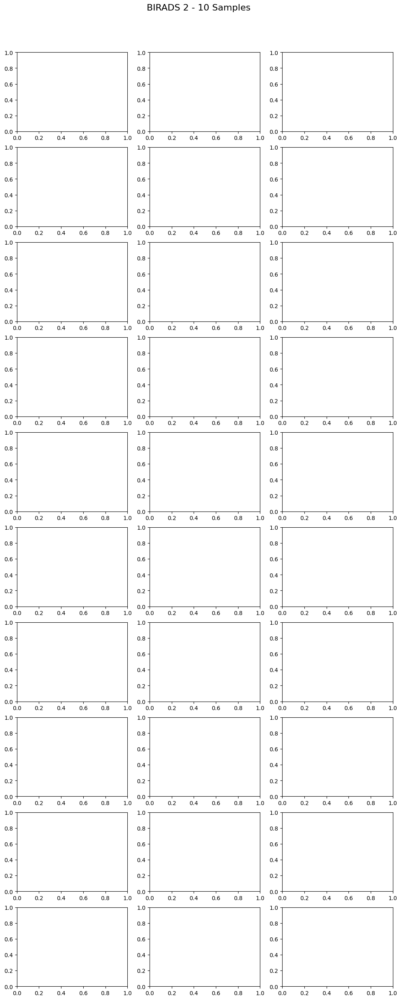

In [7]:
for birads in [2, 3, 4, 5]:
    show_samples(df, birads_value=birads, n=10, image_col="id", birads_col="birads")


birads value is 2


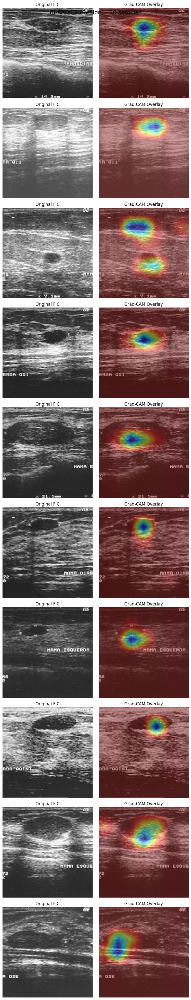

birads value is 3


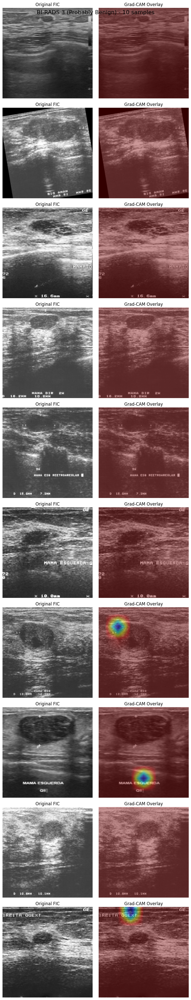

birads value is 4


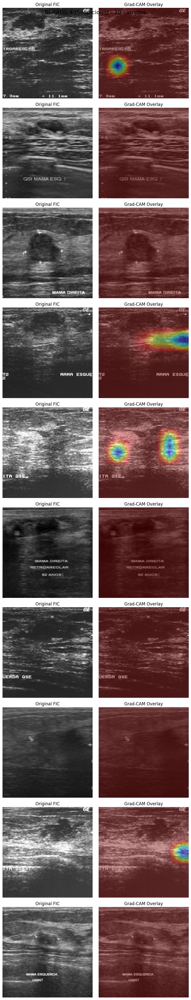

birads value is 5


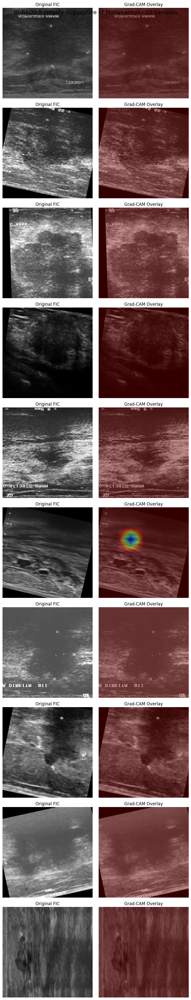

In [11]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ======================================
# Paths
# ======================================
CSV_PATH = "/kaggle/working/busbra_balanced_augmented.csv"
GRAD_CAM_DIR = "/kaggle/working/busbra_gradcam"  # where overlays are saved

# Load CSV
df = pd.read_csv(CSV_PATH)

# Label mapping
birads_classes = {
    2: "BI-RADS 2 (Benign)",
    3: "BI-RADS 3 (Probably Benign)",
    4: "BI-RADS 4 (Suspicious)",
    5: "BI-RADS 5 (Highly Suggestive of Malignancy)"
}

# ======================================
# Visualization Function
# ======================================
def show_samples(df, birads_value, n=10, fic_col="fic_path", gradcam_dir=GRAD_CAM_DIR):
    subset = df[df["birads"] == birads_value].sample(n=min(n, len(df[df["birads"] == birads_value])), random_state=42)
    
    fig, axes = plt.subplots(n, 2, figsize=(8, 4*n))
    
    for i, row in enumerate(subset.itertuples()):
        # Original FIC image
        fic_img = cv2.cvtColor(cv2.imread(getattr(row, fic_col)), cv2.COLOR_BGR2RGB)

        # Grad-CAM overlay (assumes saved with same filename but _gradcam.png)
        filename = os.path.basename(getattr(row, fic_col)).replace(".png","_gradcam.png")
        gradcam_path = os.path.join(gradcam_dir, filename)
        if os.path.exists(gradcam_path):
            gradcam_img = cv2.cvtColor(cv2.imread(gradcam_path), cv2.COLOR_BGR2RGB)
        else:
            gradcam_img = np.zeros_like(fic_img)
        
        axes[i, 0].imshow(fic_img)
        axes[i, 0].axis('off')
        axes[i, 0].set_title(f"Original FIC")

        axes[i, 1].imshow(gradcam_img)
        axes[i, 1].axis('off')
        axes[i, 1].set_title(f"Grad-CAM Overlay")
    
    plt.suptitle(f"{birads_classes[birads_value]} - {len(subset)} samples", fontsize=16)
    plt.tight_layout()
    plt.show()


# ======================================
# Show 10 samples per BI-RADS
# ======================================
for birads in [2, 3, 4, 5]:
    print( "birads value is" ,birads )
    show_samples(df, birads_value=birads, n=10)
    


In [12]:
import shutil

shutil.make_archive("/kaggle/working/busbra_gradcam_zip", 'zip', "/kaggle/working/busbra_gradcam")
print("✅ Folder zipped successfully!")


✅ Folder zipped successfully!
